Optimized parameters:
I_c: 3.56e+00
phi_0: 0.20
f: 2.53e-02
T: 0.00%
r: 7.09e-03
C: -6.47e-01


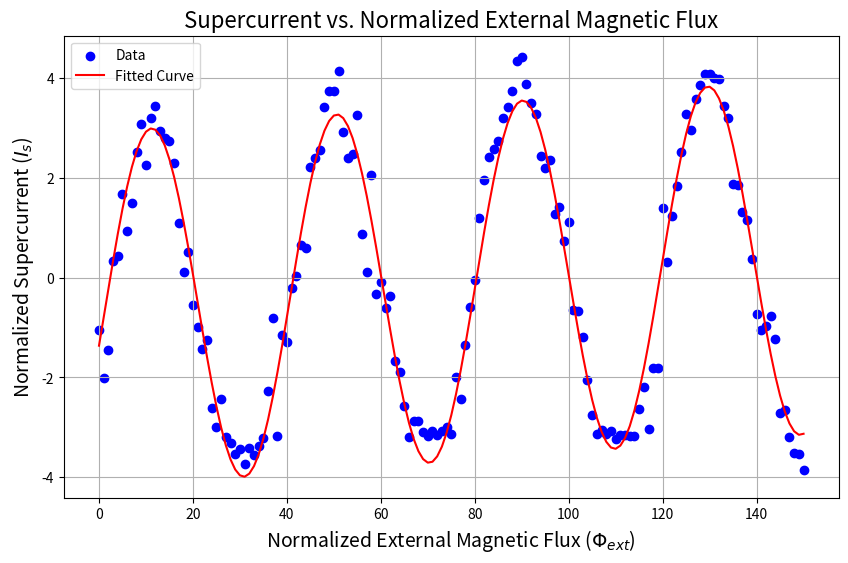

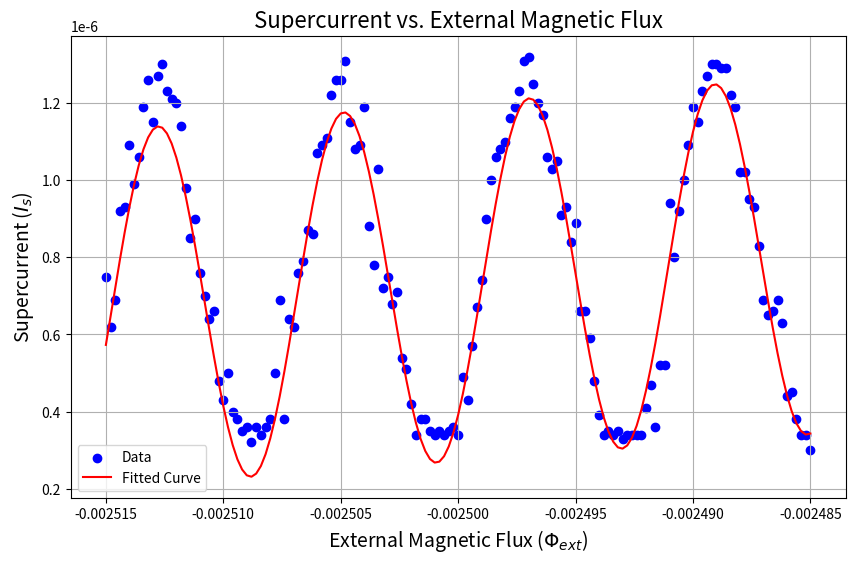

Scaled parameters:
I_c: 4.63e-07
phi_0: 0.20
f: 1.27e+05
T: 0.00%
r: 4.61e-03
C: -5.70e-07


In [89]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import curve_fit
df = pd.read_csv('Ic/511Ic+.csv')
x_data = df['y_field'].values  # 外部磁通量
y_data = df['Ic'].values      # 超導電流
# Data shift and normalization by the first data point
x_data_shifted = x_data - x_data[0]  # Shift x_data to start from zero
y_data_shifted = y_data - y_data[0]  # Shift y_data to start from zero
x_factor = x_data_shifted[1]
y_factor = abs(y_data_shifted[1])
x_data_normalized = x_data_shifted / x_factor
y_data_normalized = y_data_shifted / y_factor

x = x_data_normalized
y = y_data_normalized

# 多項式擬合 (2次)
coeffs = np.polyfit(x, y, deg=2)
background_fit = np.polyval(coeffs, x)

# 移除背景
signal_detrended = y - background_fit
y_data_normalized = signal_detrended
def model_f(Phi_ext, I_c , phi_0, f , T, r, C):
    main_phase = 2 * np.pi * f * Phi_ext - phi_0
    half_phase = main_phase / 2
    sin_half = np.sin(half_phase)
    sin_main = np.sin(main_phase)
    # 計算分母（添加數值穩定性保護）
    denominator_term = 1 - T * sin_half**2
    denominator_term = np.maximum(denominator_term, 1e-12)  # 防止除零
    denominator = np.sqrt(denominator_term)
    return I_c * sin_main / denominator + r * Phi_ext + C

# Initial parameter guesses
I_c_init = 8 # 1*np.std(y_data_normalized)  # Initial guess for critical current
phi_0_init = 0.0  # Initial guess for phase offset
f_init = 2.5e-2  # Initial guess for frequency
T_init = 0.8  # Initial guess for transparency
r_init = np.polyfit(x_data_normalized, y_data_normalized, 1)[0]+3e-02  # Initial guess for linear term
C_init = np.mean(y_data_normalized)  # Initial guess for constant term
p0 = [I_c_init, phi_0_init, f_init, T_init, r_init, C_init]  # I_c, phi_0, f, T, r, C

# Boundaries for the parameters
# I_c > 0, phi_0 in [-pi, pi], f > 0, T in [0, 1], r and C >0
#             I_c,  phi_0,      f,   T,       r,       C
bounds = ([     0, -np.pi,   1e-2, 0.0, -np.inf, -np.inf], 
          [np.inf,  np.pi, np.inf, 0.9,  np.inf,  np.inf])  

# Fit the model to the data
popt, pcov = curve_fit(model_f, x_data_normalized, y_data_normalized, p0=p0, bounds=bounds, maxfev=100000)
# Extract optimized parameters
I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt = popt

# Print optimized parameters
print(f"Optimized parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")


# Generate fitted data
fitted_y_data = model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)
# Plot the original data and the fitted curve
plt.figure(figsize=(10, 6)) 
plt.scatter(x_data_normalized, y_data_normalized, label='Data', color='blue')
plt.plot(x_data_normalized, fitted_y_data, label='Fitted Curve', color='red')
plt.xlabel('Normalized External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Normalized Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. Normalized External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()

# Plot the original data(unnormalized) and the fitted curve
plt.figure(figsize=(10, 6))
plt.scatter(x_data, y_data, label='Data', color='blue')
plt.plot(x_data, model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)*y_factor + y_data[0], label='Fitted Curve', color='red')
plt.xlabel('External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()
# Scale back the parameters to the original data
I_c_opt *= y_factor  # Scale I_c back to original units
phi_0_opt = phi_0_opt  # Phase offset remains the same
f_opt /= x_factor  # Scale frequency back to original units
T_opt = T_opt  # Transparency remains the same
r_opt *= y_factor / x_factor  # Scale r back to original units
# Scale C back to original units
C_opt *= y_factor + y_data[0]  # Scale C back to original units
# Print Scale back parameters
print(f"Scaled parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")

Optimized parameters:
I_c: 6.93e+00
phi_0: -0.52
f: 2.11e-02
T: 70.00%
r: 3.84e-04
C: -2.98e-01


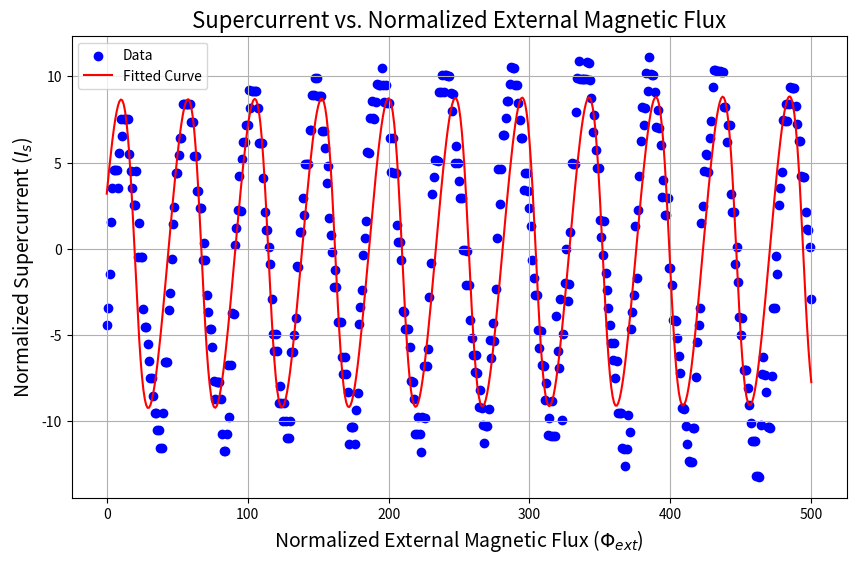

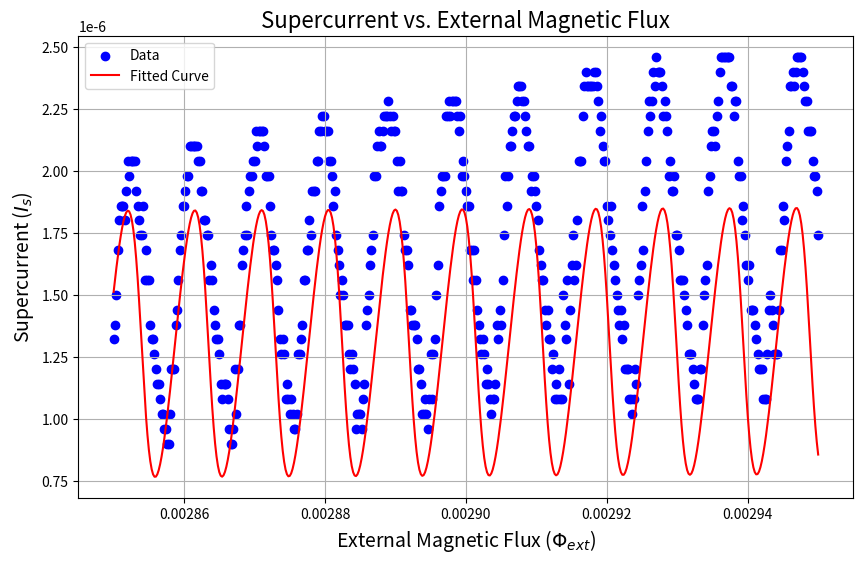

Scaled parameters:
I_c: 4.16e-07
phi_0: -0.52
f: 1.05e+05
T: 70.00%
r: 1.15e-04
C: -4.11e-07


In [88]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import curve_fit
df = pd.read_csv('Ic/kay164Ic+.csv')
x_data = df['y_field'].values  # 外部磁通量
y_data = df['Ic'].values      # 超導電流
# Data shift and normalization by the first data point
x_data_shifted = x_data - x_data[0]  # Shift x_data to start from zero
y_data_shifted = y_data - y_data[0]  # Shift y_data to start from zero
x_factor = x_data_shifted[1]
y_factor = abs(y_data_shifted[1])
x_data_normalized = x_data_shifted / x_factor
y_data_normalized = y_data_shifted / y_factor

x = x_data_normalized
y = y_data_normalized

# 多項式擬合 (2次)
coeffs = np.polyfit(x, y, deg=2)
background_fit = np.polyval(coeffs, x)

# 移除背景
signal_detrended = y - background_fit
y_data_normalized = signal_detrended
def model_f(Phi_ext, I_c , phi_0, f , T, r, C):
    main_phase = 2 * np.pi * f * Phi_ext - phi_0
    half_phase = main_phase / 2
    sin_half = np.sin(half_phase)
    sin_main = np.sin(main_phase)
    # 計算分母（添加數值穩定性保護）
    denominator_term = 1 - T * sin_half**2
    denominator_term = np.maximum(denominator_term, 1e-12)  # 防止除零
    denominator = np.sqrt(denominator_term)
    return I_c * sin_main / denominator + r * Phi_ext + C

# Initial parameter guesses
I_c_init = 8 # 1*np.std(y_data_normalized)  # Initial guess for critical current
phi_0_init = 0.0  # Initial guess for phase offset
f_init = 2e-2  # Initial guess for frequency
T_init = 0.8  # Initial guess for transparency
r_init = np.polyfit(x_data_normalized, y_data_normalized, 1)[0]+3e-02  # Initial guess for linear term
C_init = np.mean(y_data_normalized)  # Initial guess for constant term
p0 = [I_c_init, phi_0_init, f_init, T_init, r_init, C_init]  # I_c, phi_0, f, T, r, C

# Boundaries for the parameters
# I_c > 0, phi_0 in [-pi, pi], f > 0, T in [0, 1], r and C >0
#             I_c,  phi_0,      f,   T,       r,       C
bounds = ([     0, -np.pi,   1e-2, 0.7, -np.inf, -np.inf], 
          [np.inf,  np.pi, np.inf, 1.0,  np.inf,  np.inf])  

# Fit the model to the data
popt, pcov = curve_fit(model_f, x_data_normalized, y_data_normalized, p0=p0, bounds=bounds, maxfev=100000)
# Extract optimized parameters
I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt = popt

# Print optimized parameters
print(f"Optimized parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")


# Generate fitted data
fitted_y_data = model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)
# Plot the original data and the fitted curve
plt.figure(figsize=(10, 6)) 
plt.scatter(x_data_normalized, y_data_normalized, label='Data', color='blue')
plt.plot(x_data_normalized, fitted_y_data, label='Fitted Curve', color='red')
plt.xlabel('Normalized External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Normalized Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. Normalized External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()

# Plot the original data(unnormalized) and the fitted curve
plt.figure(figsize=(10, 6))
plt.scatter(x_data, y_data, label='Data', color='blue')
plt.plot(x_data, model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)*y_factor + y_data[0], label='Fitted Curve', color='red')
plt.xlabel('External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()
# Scale back the parameters to the original data
I_c_opt *= y_factor  # Scale I_c back to original units
phi_0_opt = phi_0_opt  # Phase offset remains the same
f_opt /= x_factor  # Scale frequency back to original units
T_opt = T_opt  # Transparency remains the same
r_opt *= y_factor / x_factor  # Scale r back to original units
# Scale C back to original units
C_opt *= y_factor + y_data[0]  # Scale C back to original units
# Print Scale back parameters
print(f"Scaled parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")

In [ ]:
By_71_b = -2 * np.pi * By_71[:, 1] / 0.0179e-3

# 曲线拟合
popt, pcov = curve_fit(
    func, 
    By_71_b[100:200], 
    Is_71[100:200],
    bounds=((0.1, 0.3, -np.inf, -np.inf, -np.inf, -np.inf), 
            (np.inf, 1, np.inf, np.inf, np.inf, np.inf))
)

plt.plot(By_71_b[100:200], Is_71[100:200], label='data')
plt.plot(By_71_b[100:200], func(By_71_b[100:200], *popt), label='fit')

plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

# 可选的轴标签
# plt.xlabel('$rad$') 
# plt.ylabel('I ($\mu$A)') 

# 设置图例位置在右上角
plt.legend(loc='upper right') 

plt.show()

# 输出拟合参数
print(popt)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import curve_fit
df = pd.read_csv('simulation_results.csv')
x_data = df['y_field'].values  # 外部磁通量
y_data = df['Ic'].values      # 超導電流
# Data shift and normalization by the first data point
x_data_shifted = x_data - x_data[0]  # Shift x_data to start from zero
y_data_shifted = y_data - y_data[0]  # Shift y_data to start from zero
x_factor = x_data_shifted[1]
y_factor = abs(y_data_shifted[1])
x_data_normalized = x_data_shifted / x_factor
y_data_normalized = y_data_shifted / y_factor

x = x_data_normalized
y = y_data_normalized

# 多項式擬合 (2次)
coeffs = np.polyfit(x, y, deg=2)
background_fit = np.polyval(coeffs, x)

# 移除背景
signal_detrended = y - background_fit
y_data_normalized = signal_detrended
def model_f(Phi_ext, I_c , phi_0, f , T, r, C):
    main_phase = 2 * np.pi * f * Phi_ext - phi_0
    half_phase = main_phase / 2
    sin_half = np.sin(half_phase)
    sin_main = np.sin(main_phase)
    # 計算分母（添加數值穩定性保護）
    denominator_term = 1 - T * sin_half**2
    denominator_term = np.maximum(denominator_term, 1e-12)  # 防止除零
    denominator = np.sqrt(denominator_term)
    return I_c * sin_main / denominator + r * Phi_ext + C

# Initial parameter guesses
I_c_init = 8 # 1*np.std(y_data_normalized)  # Initial guess for critical current
phi_0_init = 0.0  # Initial guess for phase offset
f_init = 2e-2  # Initial guess for frequency
T_init = 0.8  # Initial guess for transparency
r_init = np.polyfit(x_data_normalized, y_data_normalized, 1)[0]+3e-02  # Initial guess for linear term
C_init = np.mean(y_data_normalized)  # Initial guess for constant term
p0 = [I_c_init, phi_0_init, f_init, T_init, r_init, C_init]  # I_c, phi_0, f, T, r, C

# Boundaries for the parameters
# I_c > 0, phi_0 in [-pi, pi], f > 0, T in [0, 1], r and C >0
#             I_c,  phi_0,      f,   T,       r,       C
bounds = ([     0, -np.pi,   1e-2, 0.7, -np.inf, -np.inf], 
          [np.inf,  np.pi, np.inf, 1.0,  np.inf,  np.inf])  

# Fit the model to the data
popt, pcov = curve_fit(model_f, x_data_normalized, y_data_normalized, p0=p0, bounds=bounds, maxfev=100000)
# Extract optimized parameters
I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt = popt

# Print optimized parameters
print(f"Optimized parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")


# Generate fitted data
fitted_y_data = model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)
# Plot the original data and the fitted curve
plt.figure(figsize=(10, 6)) 
plt.scatter(x_data_normalized, y_data_normalized, label='Data', color='blue')
plt.plot(x_data_normalized, fitted_y_data, label='Fitted Curve', color='red')
plt.xlabel('Normalized External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Normalized Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. Normalized External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()

# Plot the original data(unnormalized) and the fitted curve
plt.figure(figsize=(10, 6))
plt.scatter(x_data, y_data, label='Data', color='blue')
plt.plot(x_data, model_f(x_data_normalized, I_c_opt, phi_0_opt, f_opt, T_opt, r_opt, C_opt)*y_factor + y_data[0], label='Fitted Curve', color='red')
plt.xlabel('External Magnetic Flux ($\Phi_{ext}$)', fontsize=14)
plt.ylabel('Supercurrent ($I_s$)', fontsize=14)
plt.title('Supercurrent vs. External Magnetic Flux', fontsize=16)
plt.legend()
plt.grid()
plt.show()
# Scale back the parameters to the original data
I_c_opt *= y_factor  # Scale I_c back to original units
phi_0_opt = phi_0_opt  # Phase offset remains the same
f_opt /= x_factor  # Scale frequency back to original units
T_opt = T_opt  # Transparency remains the same
r_opt *= y_factor / x_factor  # Scale r back to original units
# Scale C back to original units
C_opt *= y_factor + y_data[0]  # Scale C back to original units
# Print Scale back parameters
print(f"Scaled parameters:\nI_c: {I_c_opt:.2e}\nphi_0: {phi_0_opt:.2f}\nf: {f_opt:.2e}\nT: {T_opt:.2%}\nr: {r_opt:.2e}\nC: {C_opt:.2e}")

ValueError: x and y must have same first dimension, but have shapes (501,) and (1000,)

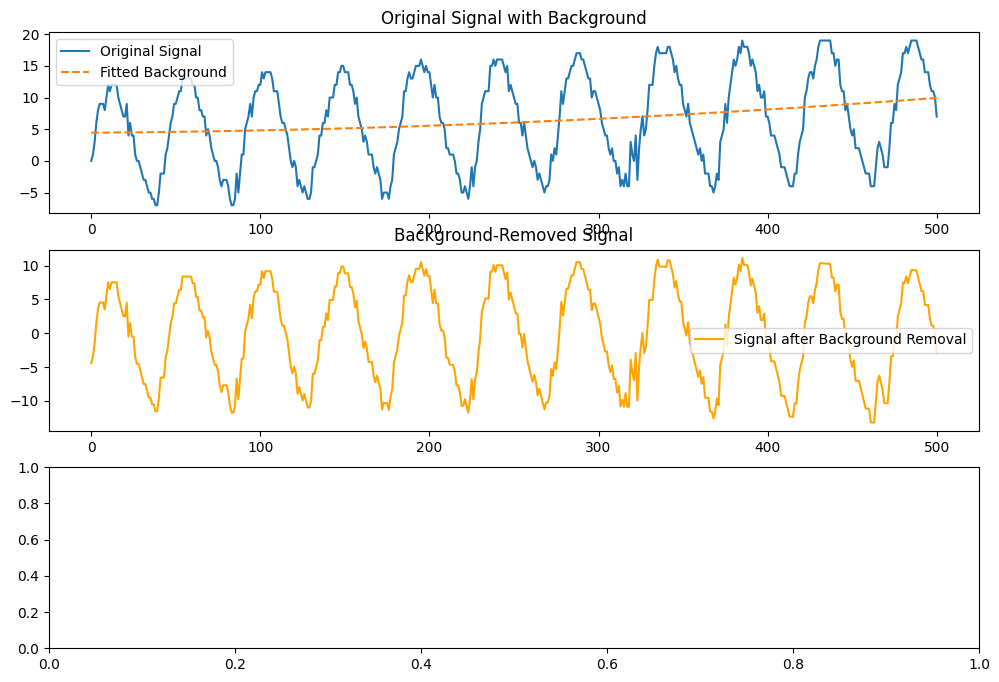

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# 模擬資料
# x = np.linspace(0, 10, 1000)
true_signal = 2 * np.sin(2 * np.pi * 1 * x + 0.5)
# background = 0.3 * x**2 - 0.5 * x + 1.0
# y = true_signal + background + np.random.normal(0, 0.1, len(x))  # 加點雜訊
x = x_data_normalized
y = y_data_normalized

# 多項式擬合 (2次)
coeffs = np.polyfit(x, y, deg=2)
background_fit = np.polyval(coeffs, x)

# 移除背景
signal_detrended = y - background_fit
plt.figure(figsize=(12, 8))

# 原始資料
plt.subplot(3,1,1)
plt.plot(x, y, label='Original Signal')
plt.plot(x, background_fit, label='Fitted Background', linestyle='--')
plt.title('Original Signal with Background')
plt.legend()

# 去背景後
plt.subplot(3,1,2)
plt.plot(x, signal_detrended, color='orange', label='Signal after Background Removal')
plt.title('Background-Removed Signal')
plt.legend()

# 比較原始正弦波 vs 去背景後
plt.subplot(3,1,3)
plt.plot(x, true_signal, label='True Sinusoid', linestyle=':')
plt.plot(x, signal_detrended, color='green', label='Recovered Sinusoid')
plt.title('Comparison with Ground Truth')
plt.legend()

plt.tight_layout()
plt.show()


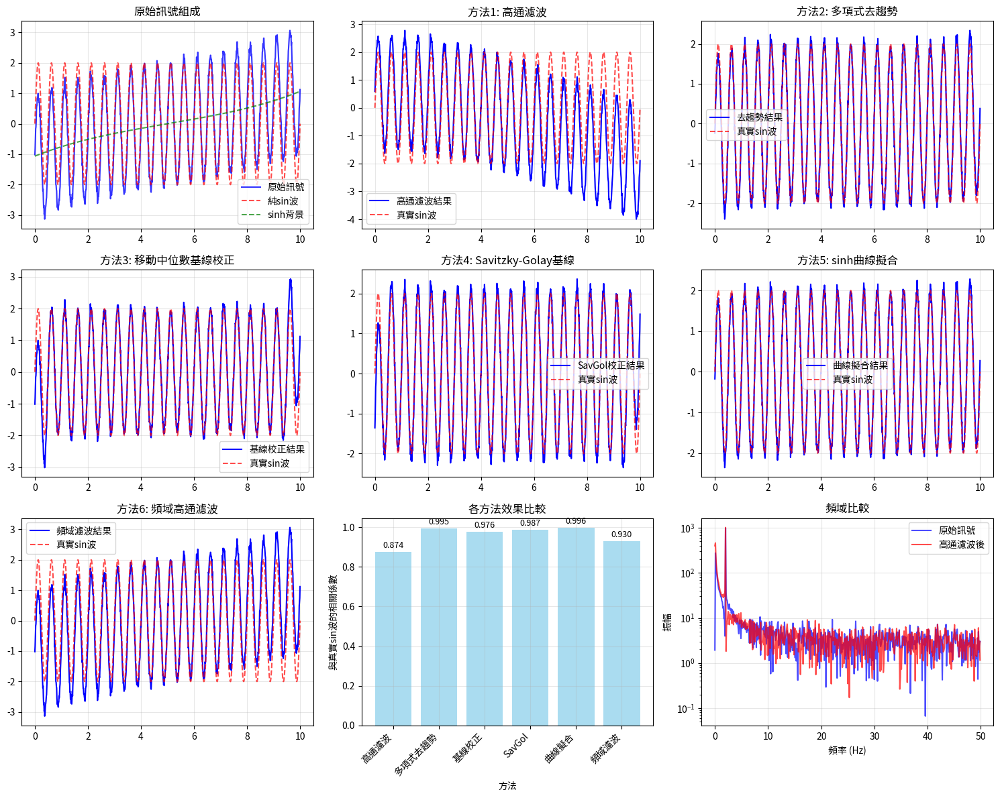

各方法與真實sin波的相關係數：
高通濾波: 0.8743
多項式去趨勢: 0.9952
基線校正: 0.9761
SavGol: 0.9871
曲線擬合: 0.9962
頻域濾波: 0.9297

最佳方法: 曲線擬合 (相關係數: 0.9962)

=== 實際應用建議 ===
1. 已知sinh背景參數 → 使用曲線擬合法
2. 不知道背景確切形式 → 使用高通濾波或Savitzky-Golay方法
3. 需要保持sin波相位信息 → 避免使用移動中位數方法
4. 背景變化緩慢 → 多項式去趨勢效果較好
5. 實時處理需求 → 簡單的高通濾波器最合適


In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.optimize import curve_fit
from scipy.ndimage import uniform_filter1d
from scipy.interpolate import interp1d

# 中文化Matplotlib
plt.rcParams['font.sans-serif'] = ['Noto Sans CJK TC']  # 設定中文字型
plt.rcParams['axes.unicode_minus'] = False  # 解決負號顯示問題

# 生成測試訊號：sin波 + sinh背景 + 噪音
np.random.seed(42)
t = np.linspace(0, 10, 1000)
freq = 2  # sin波頻率

# 原始成分
sin_wave = 2 * np.sin(2 * np.pi * freq * t)
sinh_background = 0.5 * np.sinh(0.3 * (t - 5))  # sinh背景
noise = 0.1 * np.random.randn(len(t))

# 合成訊號
original_signal = sin_wave + sinh_background + noise

plt.figure(figsize=(15, 12))

# 1. 原始訊號
plt.subplot(3, 3, 1)
plt.plot(t, original_signal, 'b-', label='原始訊號', alpha=0.8)
plt.plot(t, sin_wave, 'r--', label='純sin波', alpha=0.7)
plt.plot(t, sinh_background, 'g--', label='sinh背景', alpha=0.7)
plt.title('原始訊號組成')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法1: 高通濾波
def method1_highpass_filter(signal_data, cutoff_freq=0.1, fs=100):
    """高通濾波去除低頻sinh背景"""
    nyquist = fs / 2
    normalized_cutoff = cutoff_freq / nyquist
    
    # 設計Butterworth高通濾波器
    b, a = signal.butter(4, normalized_cutoff, btype='high')
    filtered_signal = signal.filtfilt(b, a, signal_data)
    return filtered_signal

# 方法2: 多項式去趨勢
def method2_polynomial_detrend(signal_data, degree=3):
    """多項式去趨勢"""
    x = np.arange(len(signal_data))
    # 擬合多項式
    poly_coeffs = np.polyfit(x, signal_data, degree)
    poly_trend = np.polyval(poly_coeffs, x)
    detrended = signal_data - poly_trend
    return detrended, poly_trend

# 方法3: 移動窗口中位數基線校正
def method3_baseline_correction(signal_data, window_size=100):
    """移動窗口基線校正"""
    # 使用移動中位數估計基線
    baseline = signal.medfilt(signal_data, kernel_size=window_size)
    corrected = signal_data - baseline
    return corrected, baseline

# 方法4: Savitzky-Golay基線估計
def method4_savgol_baseline(signal_data, window_length=201, polyorder=3):
    """Savitzky-Golay平滑估計基線"""
    # 使用大窗口的Savitzky-Golay濾波器估計基線
    baseline = signal.savgol_filter(signal_data, window_length, polyorder)
    corrected = signal_data - baseline
    return corrected, baseline

# 方法5: 曲線擬合法（已知sinh形式）
def sinh_func(x, a, b, c, d):
    """sinh擬合函數"""
    return a * np.sinh(b * (x - c)) + d

def method5_curve_fitting(t, signal_data):
    """曲線擬合去除sinh背景"""
    # 初始猜測參數
    initial_guess = [0.5, 0.3, 5, 0]
    
    try:
        # 擬合sinh函數
        popt, _ = curve_fit(sinh_func, t, signal_data, p0=initial_guess, maxfev=5000)
        fitted_sinh = sinh_func(t, *popt)
        
        # 從原訊號中減去擬合的sinh
        corrected = signal_data - fitted_sinh
        return corrected, fitted_sinh
    except:
        # 如果擬合失敗，返回原訊號
        return signal_data, np.zeros_like(signal_data)

# 方法6: 頻域處理
def method6_frequency_domain(signal_data, cutoff_freq=0.5, fs=100):
    """頻域低頻濾除"""
    # FFT
    fft_signal = np.fft.fft(signal_data)
    freqs = np.fft.fftfreq(len(signal_data), 1/fs)
    
    # 創建高通濾波器
    fft_filtered = fft_signal.copy()
    fft_filtered[np.abs(freqs) < cutoff_freq] = 0
    
    # IFFT
    filtered_signal = np.real(np.fft.ifft(fft_filtered))
    return filtered_signal

# 執行各種方法
fs = 1000  # 採樣頻率

# 方法1: 高通濾波
result1 = method1_highpass_filter(original_signal, cutoff_freq=0.1, fs=fs)

plt.subplot(3, 3, 2)
plt.plot(t, result1, 'b-', label='高通濾波結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法1: 高通濾波')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法2: 多項式去趨勢
result2, trend2 = method2_polynomial_detrend(original_signal, degree=4)

plt.subplot(3, 3, 3)
plt.plot(t, result2, 'b-', label='去趨勢結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法2: 多項式去趨勢')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法3: 基線校正
result3, baseline3 = method3_baseline_correction(original_signal, window_size=101)

plt.subplot(3, 3, 4)
plt.plot(t, result3, 'b-', label='基線校正結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法3: 移動中位數基線校正')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法4: Savitzky-Golay基線
result4, baseline4 = method4_savgol_baseline(original_signal, window_length=201, polyorder=3)

plt.subplot(3, 3, 5)
plt.plot(t, result4, 'b-', label='SavGol校正結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法4: Savitzky-Golay基線')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法5: 曲線擬合
result5, fitted5 = method5_curve_fitting(t, original_signal)

plt.subplot(3, 3, 6)
plt.plot(t, result5, 'b-', label='曲線擬合結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法5: sinh曲線擬合')
plt.legend()
plt.grid(True, alpha=0.3)

# 方法6: 頻域處理
result6 = method6_frequency_domain(original_signal, cutoff_freq=0.5, fs=fs)

plt.subplot(3, 3, 7)
plt.plot(t, result6, 'b-', label='頻域濾波結果')
plt.plot(t, sin_wave, 'r--', label='真實sin波', alpha=0.7)
plt.title('方法6: 頻域高通濾波')
plt.legend()
plt.grid(True, alpha=0.3)

# 比較所有方法的效果（計算與真實sin波的相關係數）
methods = ['高通濾波', '多項式去趨勢', '基線校正', 'SavGol', '曲線擬合', '頻域濾波']
results = [result1, result2, result3, result4, result5, result6]
correlations = [np.corrcoef(sin_wave, result)[0,1] for result in results]

plt.subplot(3, 3, 8)
bars = plt.bar(range(len(methods)), correlations, color='skyblue', alpha=0.7)
plt.xlabel('方法')
plt.ylabel('與真實sin波的相關係數')
plt.title('各方法效果比較')
plt.xticks(range(len(methods)), methods, rotation=45, ha='right')
plt.grid(True, alpha=0.3)

# 在柱狀圖上顯示數值
for i, (bar, corr) in enumerate(zip(bars, correlations)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{corr:.3f}', ha='center', va='bottom', fontsize=9)

# 頻域分析
plt.subplot(3, 3, 9)
freqs = np.fft.fftfreq(len(original_signal), t[1] - t[0])
fft_original = np.abs(np.fft.fft(original_signal))
fft_result1 = np.abs(np.fft.fft(result1))

plt.semilogy(freqs[:len(freqs)//2], fft_original[:len(freqs)//2], 'b-', label='原始訊號', alpha=0.7)
plt.semilogy(freqs[:len(freqs)//2], fft_result1[:len(freqs)//2], 'r-', label='高通濾波後', alpha=0.7)
plt.xlabel('頻率 (Hz)')
plt.ylabel('振幅')
plt.title('頻域比較')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 輸出效果評估
print("各方法與真實sin波的相關係數：")
for method, corr in zip(methods, correlations):
    print(f"{method}: {corr:.4f}")

print(f"\n最佳方法: {methods[np.argmax(correlations)]} (相關係數: {max(correlations):.4f})")

# 實際應用建議
print("\n=== 實際應用建議 ===")
print("1. 已知sinh背景參數 → 使用曲線擬合法")
print("2. 不知道背景確切形式 → 使用高通濾波或Savitzky-Golay方法")
print("3. 需要保持sin波相位信息 → 避免使用移動中位數方法")
print("4. 背景變化緩慢 → 多項式去趨勢效果較好")
print("5. 實時處理需求 → 簡單的高通濾波器最合適")

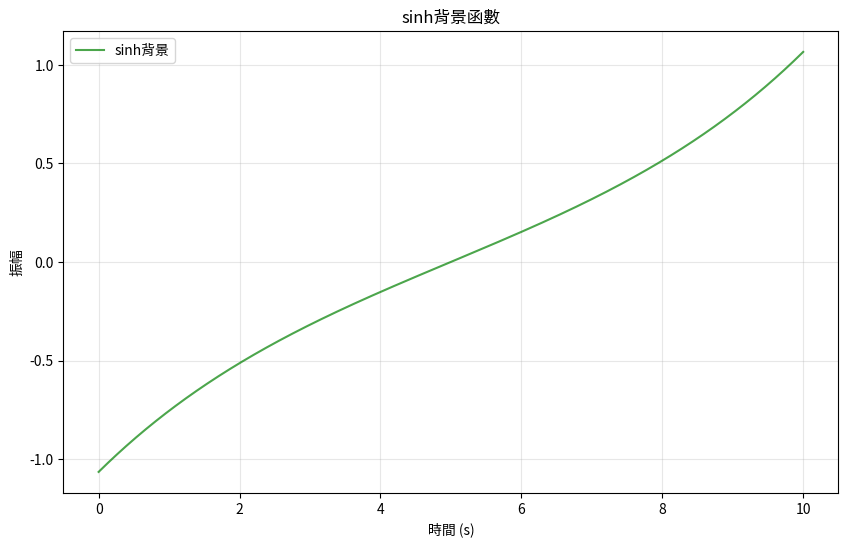

In [53]:
# 可視化sinh背景
plt.figure(figsize=(10, 6))
plt.plot(t, sinh_background, 'g-', label='sinh背景', alpha=0.7)
plt.title('sinh背景函數')
plt.xlabel('時間 (s)')
plt.ylabel('振幅')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

生成的測試信號包含：
- 高頻sin波: 50 Hz, 振幅 1.0
- 低頻sinc背景: 中心頻率約 5 Hz, 振幅 0.3

正在執行各種去背景方法...

性能評估:
方法                    | SNR (dB) | 與原始信號相關性
-------------------------------------------------------
低通濾波器減法              |    38.81 |           1.000
高通濾波器                |    38.86 |           1.000
帶通濾波器                |    35.07 |           1.000
FFT域濾波               |    79.93 |           1.000
移動平均減法               |    33.11 |           1.000
Savitzky-Golay減法     |    22.81 |           0.998


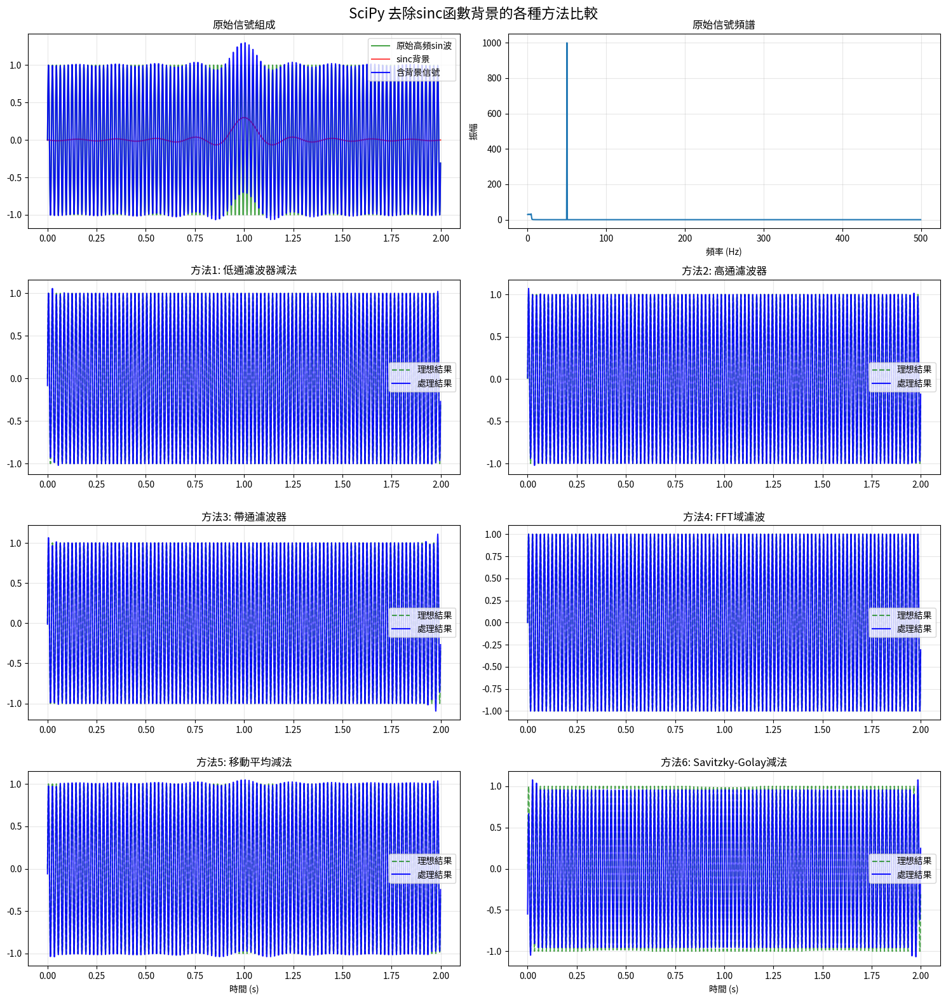

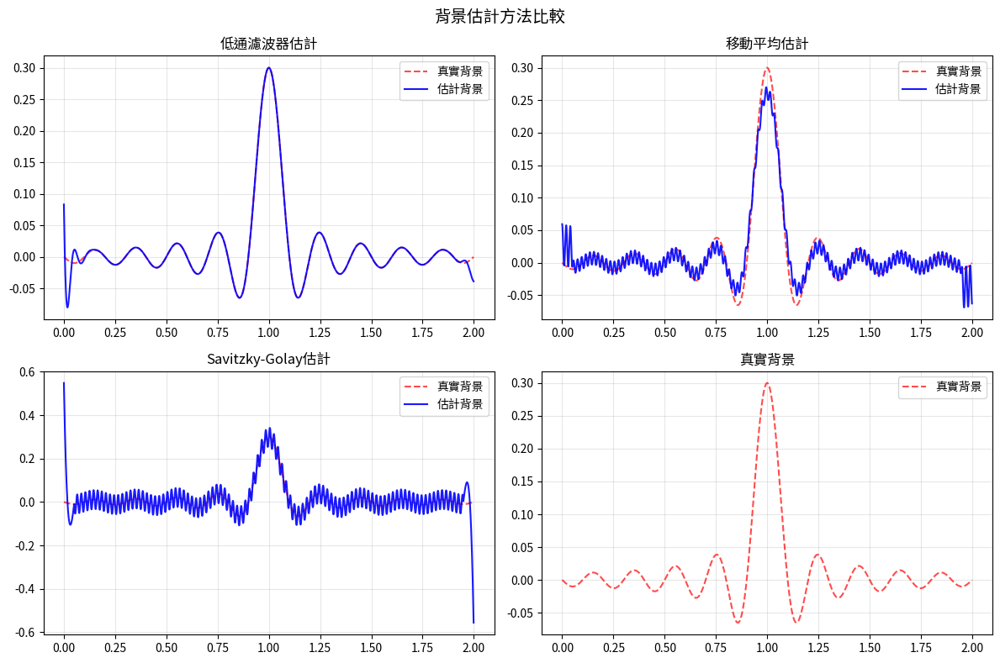


總結:
1. 低通濾波器減法: 適合背景頻率與主信號頻率差異較大的情況
2. 高通濾波器: 簡單直接，但可能影響主信號的低頻成分
3. 帶通濾波器: 當已知主信號頻率範圍時效果最好
4. FFT域濾波: 提供精確的頻率控制
5. 移動平均減法: 適合緩慢變化的背景
6. Savitzky-Golay減法: 能更好地保持信號形狀


In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
from scipy.ndimage import gaussian_filter1d
import warnings
warnings.filterwarnings('ignore')

# 設定參數
fs = 1000  # 採樣頻率
t = np.linspace(0, 2, fs*2, endpoint=False)  # 時間軸
dt = t[1] - t[0]

# 生成測試信號
# 高頻sin波 (主要信號)
high_freq = 50  # Hz
signal_amplitude = 1.0
clean_signal = signal_amplitude * np.sin(2 * np.pi * high_freq * t)

# 低頻sinc函數背景 (噪聲/背景)
sinc_freq = 5  # Hz
sinc_amplitude = 0.3
background = sinc_amplitude * np.sinc(2 * sinc_freq * (t - 1))  # 中心在t=1

# 合成含背景的信號
noisy_signal = clean_signal + background

print("生成的測試信號包含：")
print(f"- 高頻sin波: {high_freq} Hz, 振幅 {signal_amplitude}")
print(f"- 低頻sinc背景: 中心頻率約 {sinc_freq} Hz, 振幅 {sinc_amplitude}")

# 方法1: 低通濾波器去除高頻，然後從原信號中減去
def method1_lowpass_subtraction(signal_data, fs, cutoff_freq=15):
    """使用低通濾波器提取背景，然後減去"""
    # 設計低通濾波器
    nyquist = fs / 2
    normalized_cutoff = cutoff_freq / nyquist
    b, a = signal.butter(4, normalized_cutoff, btype='low')
    
    # 提取低頻背景
    background_estimate = signal.filtfilt(b, a, signal_data)
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法2: 高通濾波器直接去除低頻成分
def method2_highpass_filter(signal_data, fs, cutoff_freq=20):
    """使用高通濾波器直接去除低頻成分"""
    nyquist = fs / 2
    normalized_cutoff = cutoff_freq / nyquist
    b, a = signal.butter(4, normalized_cutoff, btype='high')
    
    cleaned_signal = signal.filtfilt(b, a, signal_data)
    
    return cleaned_signal

# 方法3: 帶通濾波器保留特定頻率範圍
def method3_bandpass_filter(signal_data, fs, low_freq=30, high_freq=70):
    """使用帶通濾波器保留主要信號頻率範圍"""
    nyquist = fs / 2
    low_normalized = low_freq / nyquist
    high_normalized = high_freq / nyquist
    b, a = signal.butter(4, [low_normalized, high_normalized], btype='band')
    
    cleaned_signal = signal.filtfilt(b, a, signal_data)
    
    return cleaned_signal

# 方法4: FFT域處理
def method4_fft_filtering(signal_data, fs, cutoff_freq=25):
    """在頻域中去除低頻成分"""
    # FFT
    signal_fft = fft(signal_data)
    freqs = fftfreq(len(signal_data), dt)
    
    # 創建高通濾波器遮罩
    mask = np.abs(freqs) > cutoff_freq
    
    # 應用遮罩
    filtered_fft = signal_fft * mask
    
    # IFFT回到時域
    cleaned_signal = np.real(ifft(filtered_fft))
    
    return cleaned_signal

# 方法5: 移動平均背景估計
def method5_moving_average_subtraction(signal_data, window_size=101):
    """使用移動平均估計背景並減去"""
    # 計算移動平均作為背景估計
    background_estimate = np.convolve(signal_data, np.ones(window_size)/window_size, mode='same')
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法6: Savitzky-Golay濾波器背景估計
def method6_savgol_subtraction(signal_data, window_length=101, polyorder=3):
    """使用Savitzky-Golay濾波器估計背景並減去"""
    # 確保window_length為奇數
    if window_length % 2 == 0:
        window_length += 1
    
    # 使用Savitzky-Golay濾波器估計背景
    background_estimate = signal.savgol_filter(signal_data, window_length, polyorder)
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 執行所有方法
print("\n正在執行各種去背景方法...")

# 方法1
cleaned_method1, bg_method1 = method1_lowpass_subtraction(noisy_signal, fs)

# 方法2
cleaned_method2 = method2_highpass_filter(noisy_signal, fs)

# 方法3
cleaned_method3 = method3_bandpass_filter(noisy_signal, fs)

# 方法4
cleaned_method4 = method4_fft_filtering(noisy_signal, fs)

# 方法5
cleaned_method5, bg_method5 = method5_moving_average_subtraction(noisy_signal)

# 方法6
cleaned_method6, bg_method6 = method6_savgol_subtraction(noisy_signal)

# 計算各方法的性能指標
def calculate_snr(clean, noisy):
    """計算信噪比"""
    signal_power = np.mean(clean**2)
    noise_power = np.mean((noisy - clean)**2)
    if noise_power == 0:
        return float('inf')
    return 10 * np.log10(signal_power / noise_power)

def calculate_correlation(signal1, signal2):
    """計算相關係數"""
    return np.corrcoef(signal1, signal2)[0, 1]

print("\n性能評估:")
print("方法                    | SNR (dB) | 與原始信號相關性")
print("-" * 55)

methods = [
    ("低通濾波器減法", cleaned_method1),
    ("高通濾波器", cleaned_method2),
    ("帶通濾波器", cleaned_method3),
    ("FFT域濾波", cleaned_method4),
    ("移動平均減法", cleaned_method5),
    ("Savitzky-Golay減法", cleaned_method6)
]

for name, cleaned in methods:
    snr = calculate_snr(clean_signal, cleaned)
    corr = calculate_correlation(clean_signal, cleaned)
    print(f"{name:<20} | {snr:8.2f} | {corr:15.3f}")

# 繪製結果
fig, axes = plt.subplots(4, 2, figsize=(15, 16))
fig.suptitle('SciPy 去除sinc函數背景的各種方法比較', fontsize=16)

# 原始信號
axes[0, 0].plot(t, clean_signal, 'g-', label='原始高頻sin波', alpha=0.7)
axes[0, 0].plot(t, background, 'r-', label='sinc背景', alpha=0.7)
axes[0, 0].plot(t, noisy_signal, 'b-', label='含背景信號', alpha=0.9)
axes[0, 0].set_title('原始信號組成')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 頻譜分析
freqs = fftfreq(len(noisy_signal), dt)
signal_fft = np.abs(fft(noisy_signal))
axes[0, 1].plot(freqs[:len(freqs)//2], signal_fft[:len(freqs)//2])
axes[0, 1].set_title('原始信號頻譜')
axes[0, 1].set_xlabel('頻率 (Hz)')
axes[0, 1].set_ylabel('振幅')
axes[0, 1].grid(True, alpha=0.3)

# 各方法結果
plot_configs = [
    (cleaned_method1, "方法1: 低通濾波器減法"),
    (cleaned_method2, "方法2: 高通濾波器"),
    (cleaned_method3, "方法3: 帶通濾波器"),
    (cleaned_method4, "方法4: FFT域濾波"),
    (cleaned_method5, "方法5: 移動平均減法"),
    (cleaned_method6, "方法6: Savitzky-Golay減法")
]

for i, (cleaned, title) in enumerate(plot_configs):
    row = (i + 2) // 2
    col = (i + 2) % 2
    
    axes[row, col].plot(t, clean_signal, 'g--', label='理想結果', alpha=0.7)
    axes[row, col].plot(t, cleaned, 'b-', label='處理結果', alpha=0.9)
    axes[row, col].set_title(title)
    axes[row, col].legend()
    axes[row, col].grid(True, alpha=0.3)
    
    if row == 3:  # 最後一行添加x軸標籤
        axes[row, col].set_xlabel('時間 (s)')

plt.tight_layout()
plt.show()

# 顯示背景估計比較
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('背景估計方法比較', fontsize=14)

background_methods = [
    (bg_method1, "低通濾波器估計"),
    (bg_method5, "移動平均估計"),
    (bg_method6, "Savitzky-Golay估計"),
    (background, "真實背景")
]

for i, (bg_est, title) in enumerate(background_methods):
    row = i // 2
    col = i % 2
    
    axes[row, col].plot(t, background, 'r--', label='真實背景', alpha=0.7)
    if title != "真實背景":
        axes[row, col].plot(t, bg_est, 'b-', label='估計背景', alpha=0.9)
    axes[row, col].set_title(title)
    axes[row, col].legend()
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n總結:")
print("1. 低通濾波器減法: 適合背景頻率與主信號頻率差異較大的情況")
print("2. 高通濾波器: 簡單直接，但可能影響主信號的低頻成分")
print("3. 帶通濾波器: 當已知主信號頻率範圍時效果最好")
print("4. FFT域濾波: 提供精確的頻率控制")
print("5. 移動平均減法: 適合緩慢變化的背景")
print("6. Savitzky-Golay減法: 能更好地保持信號形狀")

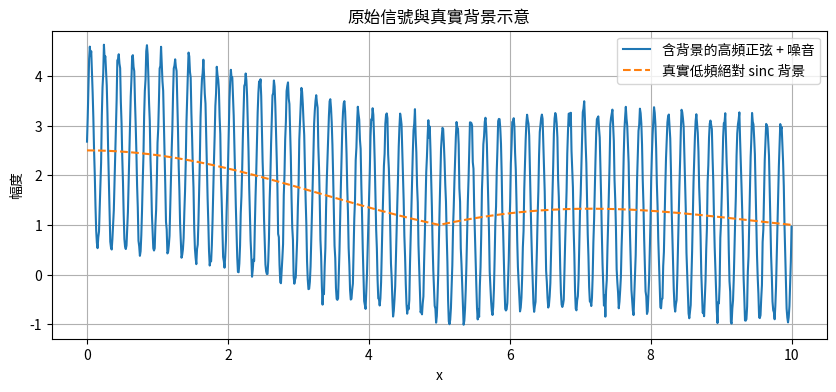

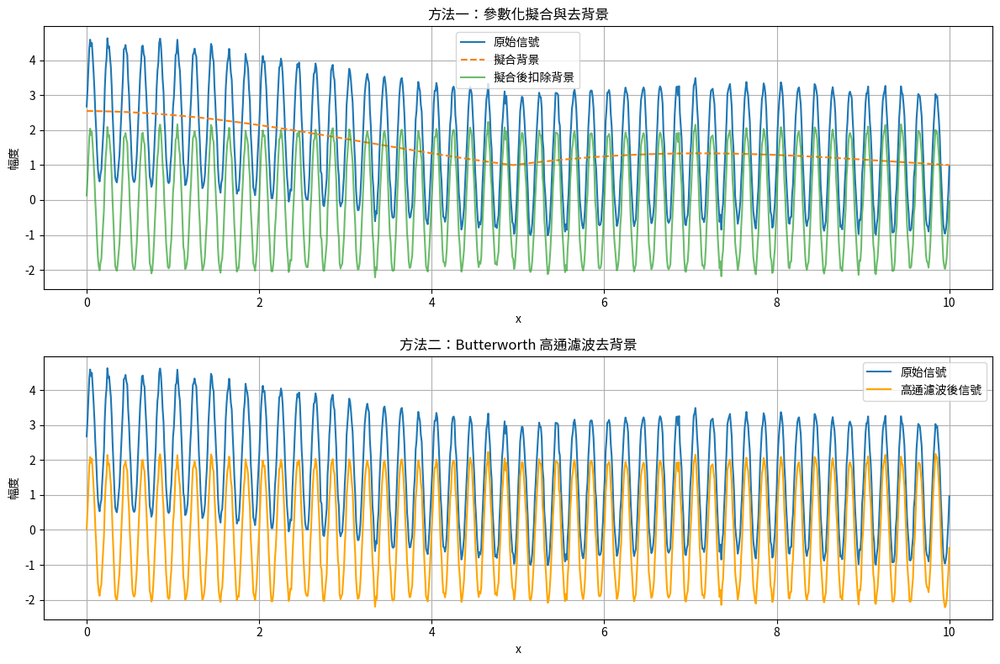

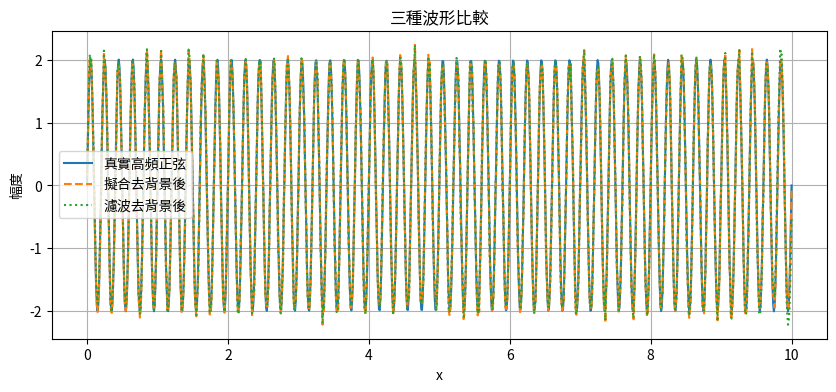

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.signal import butter, filtfilt

# 1. 產生示例資料
np.random.seed(0)
x = np.linspace(0, 10, 1000)

# 高頻正弦信號 (頻率 5 Hz)
high_freq = 2.0 * np.sin(2 * np.pi * 5 * x)

# 低頻絕對值 sinc 函數背景 (偏移量 1.0)
def abs_sinc(x, a, b, c):
    # a: 振幅, b: 頻率因子, c: 偏移
    return 1.0 + a * np.abs(np.sinc(b * (x - c)))

background_true = abs_sinc(x, a=1.5, b=0.2, c=0.0)

# 加總並加入少量雜訊
y = high_freq + background_true + 0.1 * np.random.normal(size=len(x))

# 繪製原始資料
plt.figure(figsize=(10, 4))
plt.plot(x, y, label='含背景的高頻正弦 + 噪音')
plt.plot(x, background_true, '--', label='真實低頻絕對 sinc 背景')
plt.legend()
plt.title("原始信號與真實背景示意")
plt.xlabel("x")
plt.ylabel("幅度")
plt.grid(True)
plt.show()

# 2. 方法一：參數化擬合 (curve_fit)
def model_background(x, a, b, c):
    return 1.0 + a * np.abs(np.sinc(b * (x - c)))

# 先對 y 進行擬合，只擬合低頻背景部分 (可用較粗取樣加速，但此處保持原尺寸)
popt, _ = curve_fit(model_background, x, y, p0=[1.0, 0.1, 0.0])
fitted_bg = model_background(x, *popt)
detrended_signal_fit = y - fitted_bg

# 3. 方法二：高通濾波 (Butterworth)
# 設計一個通帶截止頻率為 2 Hz (介於低頻背景與高頻正弦之間)，數位化取樣率 fs = 100 Hz (1/(x[1]-x[0]) ≈ 100)
fs = 1.0 / (x[1] - x[0])
cutoff = 2  # Hz
nyquist = 0.5 * fs
normal_cutoff = cutoff / nyquist
b, a = butter(N=4, Wn=normal_cutoff, btype='high', analog=False)
detrended_signal_filt = filtfilt(b, a, y)

# 4. 視覺化比較
plt.figure(figsize=(12, 8))

# 左：擬合結果
plt.subplot(2, 1, 1)
plt.plot(x, y, label='原始信號')
plt.plot(x, fitted_bg, '--', label='擬合背景')
plt.plot(x, detrended_signal_fit, alpha=0.7, label='擬合後扣除背景')
plt.legend()
plt.title("方法一：參數化擬合與去背景")
plt.xlabel("x")
plt.ylabel("幅度")
plt.grid(True)

# 右：高通濾波結果
plt.subplot(2, 1, 2)
plt.plot(x, y, label='原始信號')
plt.plot(x, detrended_signal_filt, color='orange', label='高通濾波後信號')
plt.legend()
plt.title("方法二：Butterworth 高通濾波去背景")
plt.xlabel("x")
plt.ylabel("幅度")
plt.grid(True)

plt.tight_layout()
plt.show()

# 5. 比較三種波形：真實高頻正弦、擬合後、濾波後
plt.figure(figsize=(10, 4))
plt.plot(x, high_freq, label='真實高頻正弦')
plt.plot(x, detrended_signal_fit, '--', label='擬合去背景後')
plt.plot(x, detrended_signal_filt, ':', label='濾波去背景後')
plt.legend()
plt.title("三種波形比較")
plt.xlabel("x")
plt.ylabel("幅度")
plt.grid(True)
plt.show()


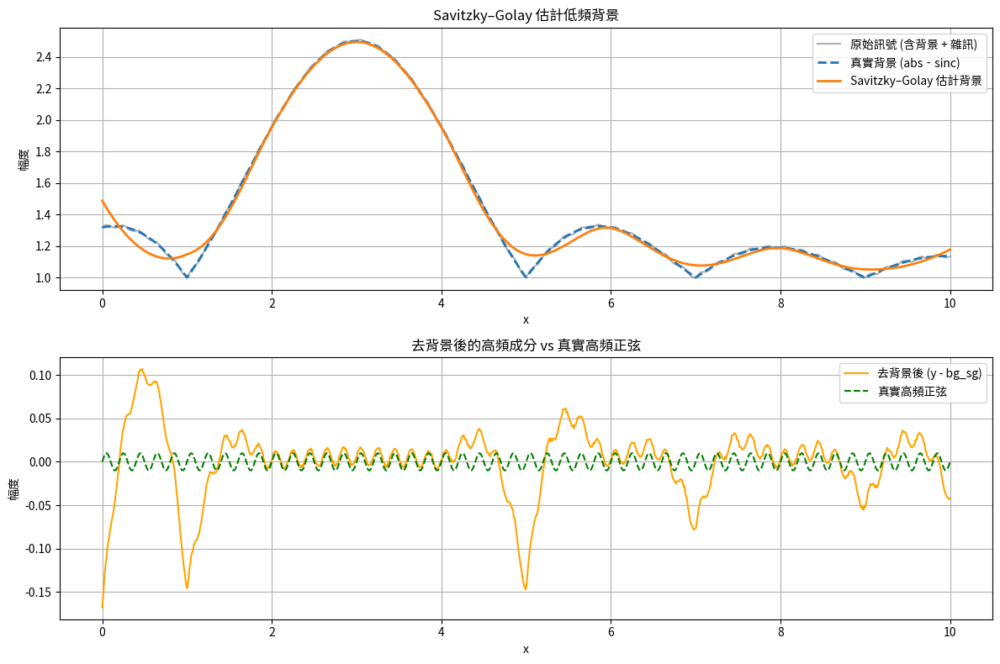

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# 1. 建立示例資料（相較於之前，把正弦振幅調小）
np.random.seed(0)
x = np.linspace(0, 10, 1000)

# 真正的「高頻正弦」：頻率 5 Hz，但振幅只剩 0.2
true_hf_amp = 0.01
high_freq = true_hf_amp * np.sin(2 * np.pi * 5 * x)

# 真正的「低頻 |sinc| 背景」：a=1.5, b=0.2, c=0
def abs_sinc(x, a, b, c):
    return 1.0 + a * np.abs(np.sinc(b * (x - c)))

background_true = abs_sinc(x, a=1.5, b=0.5, c=3.0)

# 合成含雜訊的觀測 y
y = high_freq + background_true + 0.001 * np.random.normal(size=len(x))

# 2. 用 Savitzky‐Golay 做「極低頻平滑」
#    window_length 必須是奇數，且愈大就愈「忽略高頻細節」。這裡取 201 個點左右，即約 2 秒（假設 fs≈100 Hz）
window_length = 201
polyorder = 2  # 用 2 次多項式來做局部擬合
bg_sg = savgol_filter(y, window_length=window_length, polyorder=polyorder)

# 3. 計算去背景後的訊號
detrended_sg = y - bg_sg

# 4. 繪圖比較
plt.figure(figsize=(12, 8))

# 原始含背景 vs 估計背景（SG）
plt.subplot(2, 1, 1)
plt.plot(x, y, label='原始訊號 (含背景 + 雜訊)', color='gray', alpha=0.6)
plt.plot(x, background_true, '--', label='真實背景 (abs‐sinc)', linewidth=2)
plt.plot(x, bg_sg, '-', label='Savitzky–Golay 估計背景', linewidth=2)
plt.title("Savitzky–Golay 估計低頻背景")
plt.xlabel("x")
plt.ylabel("幅度")
plt.legend()
plt.grid(True)

# 去背景後 vs 真實高頻正弦
plt.subplot(2, 1, 2)
plt.plot(x, detrended_sg, label='去背景後 (y - bg_sg)', color='orange')
plt.plot(x, high_freq, '--', label='真實高頻正弦', color='green')
plt.title("去背景後的高頻成分 vs 真實高頻正弦")
plt.xlabel("x")
plt.ylabel("幅度")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


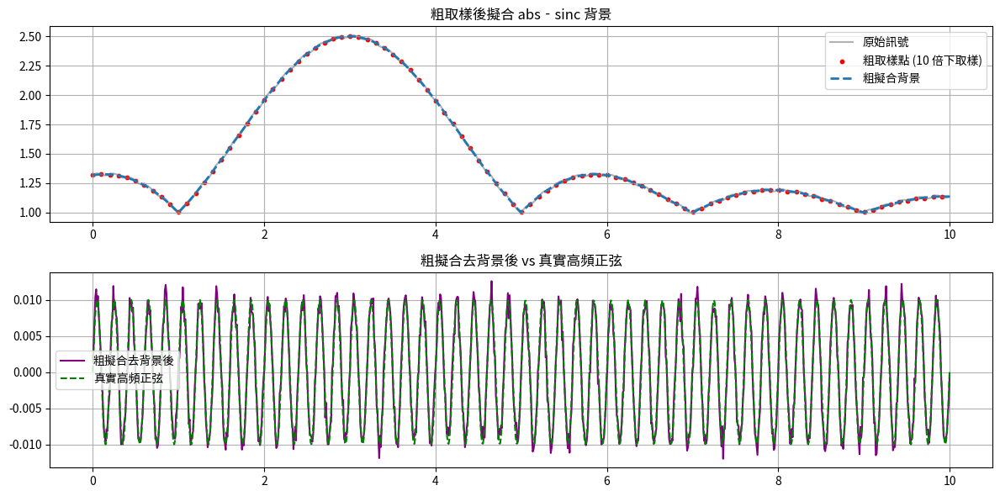

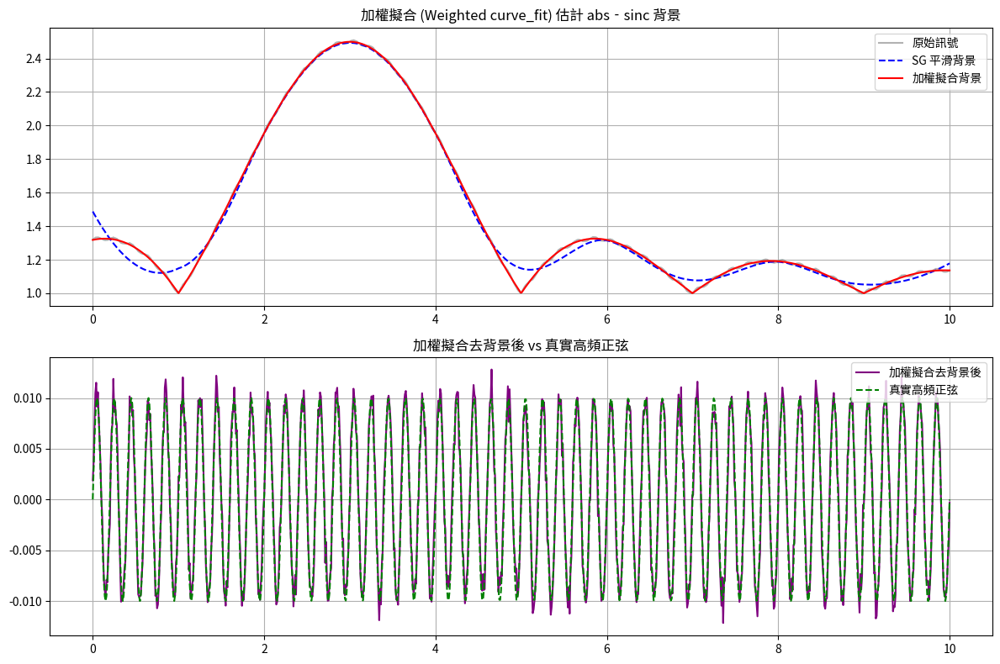

In [64]:
from scipy.optimize import curve_fit
from scipy.optimize import curve_fit

# 1. 粗取樣：原本 1000 點，每隔 10 點擷取一次
x_coarse = x[::10]
y_coarse = y[::10]

# 2. 用相同的 abs_sinc 公式來擬合「粗取樣後的 y」
def model_abs_sinc(x, a, b, c):
    return 1.0 + a * np.abs(np.sinc(b * (x - c)))

# 3. curve_fit (給一個較合理的初值 p0)
popt_coarse, _ = curve_fit(model_abs_sinc, x_coarse, y_coarse, p0=[1.0, 0.1, 0.0])

# 4. 用 popt_coarse 在原始 x 上算擬合背景
fitted_bg_coarse = model_abs_sinc(x, *popt_coarse)

# 5. 去背景
detrended_coarse = y - fitted_bg_coarse

# 繪圖檢視
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(x, y, color='gray', alpha=0.6, label='原始訊號')
plt.scatter(x_coarse, y_coarse, color='red', s=10, label='粗取樣點 (10 倍下取樣)')
plt.plot(x, fitted_bg_coarse, '--', linewidth=2, label='粗擬合背景')
plt.title("粗取樣後擬合 abs‐sinc 背景")
plt.legend()
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(x, detrended_coarse, color='purple', label='粗擬合去背景後')
plt.plot(x, high_freq, '--', color='green', label='真實高頻正弦')
plt.title("粗擬合去背景後 vs 真實高頻正弦")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# 1. 先執行 Savitzky–Golay 平滑，得到 bg_sg
bg_sg = savgol_filter(y, window_length=201, polyorder=2)

# 2. 計算殘差 r(x)
residual = y - bg_sg

# 3. 定義權重 w(x) = 1/(1 + λ·|r|)
lambda_param = 5.0
weights = 1.0 / (1.0 + lambda_param * np.abs(residual))

# 注意：curve_fit 接受 sigma 參數，若 sigma[i] 大 → 第 i 個資料點的「權重」小。
sigma = 1.0 / weights  # 也就是 σ ∝ (1 + λ·|r|)

# 4. 執行加權擬合
popt_w, _ = curve_fit(model_abs_sinc, x, y, p0=[1.0, 0.1, 0.0], sigma=sigma, absolute_sigma=True)
fitted_bg_w = model_abs_sinc(x, *popt_w)
detrended_w = y - fitted_bg_w

# 5. 繪圖檢視
plt.figure(figsize=(12, 8))

plt.subplot(2,1,1)
plt.plot(x, y, color='gray', alpha=0.6, label='原始訊號')
plt.plot(x, bg_sg, '--', color='blue', label='SG 平滑背景')
plt.plot(x, fitted_bg_w, '-', color='red', label='加權擬合背景')
plt.title("加權擬合 (Weighted curve_fit) 估計 abs‐sinc 背景")
plt.legend()
plt.grid(True)

plt.subplot(2,1,2)
plt.plot(x, detrended_w, label='加權擬合去背景後', color='purple')
plt.plot(x, high_freq, '--', label='真實高頻正弦', color='green')
plt.title("加權擬合去背景後 vs 真實高頻正弦")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


生成的測試信號包含：
- 高頻sin波: 50 Hz, 振幅 1.0
- |sinc|背景: 中心頻率約 8 Hz, 振幅 0.4
- sinc絕對值背景具有非負性和更複雜的頻譜特徵

正在執行各種去除sinc絕對值背景的方法...

性能評估:
方法                    | SNR (dB) | 相關性 | RMSE
------------------------------------------------------------
形態學濾波                |    33.79 |  1.000 |  0.014
中值濾波減法               |    23.00 |  0.998 |  0.050
分位數濾波減法              |     0.61 |  0.996 |  0.659
高斯加權減法               |    30.00 |  1.000 |  0.022
多尺度分解                |     9.26 |  0.998 |  0.244
頻域notch濾波            |    20.05 |  0.996 |  0.070
包絡線減法                |    48.52 |  1.000 |  0.003
自適應閾值減法              |     2.97 |  0.902 |  0.502


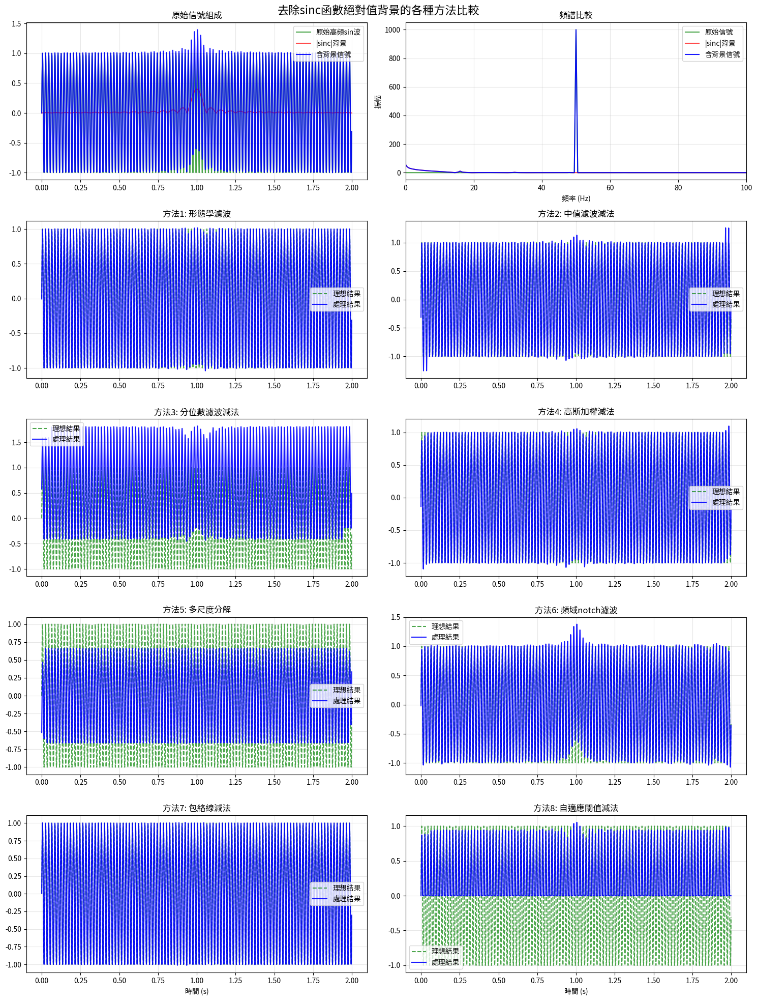

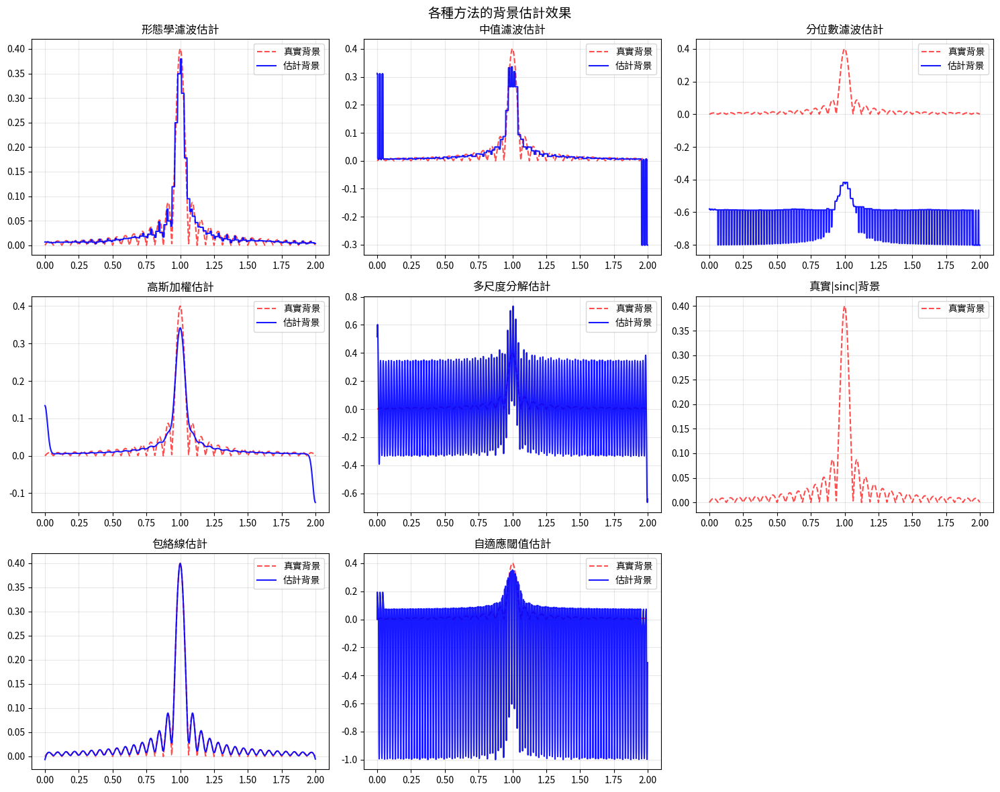

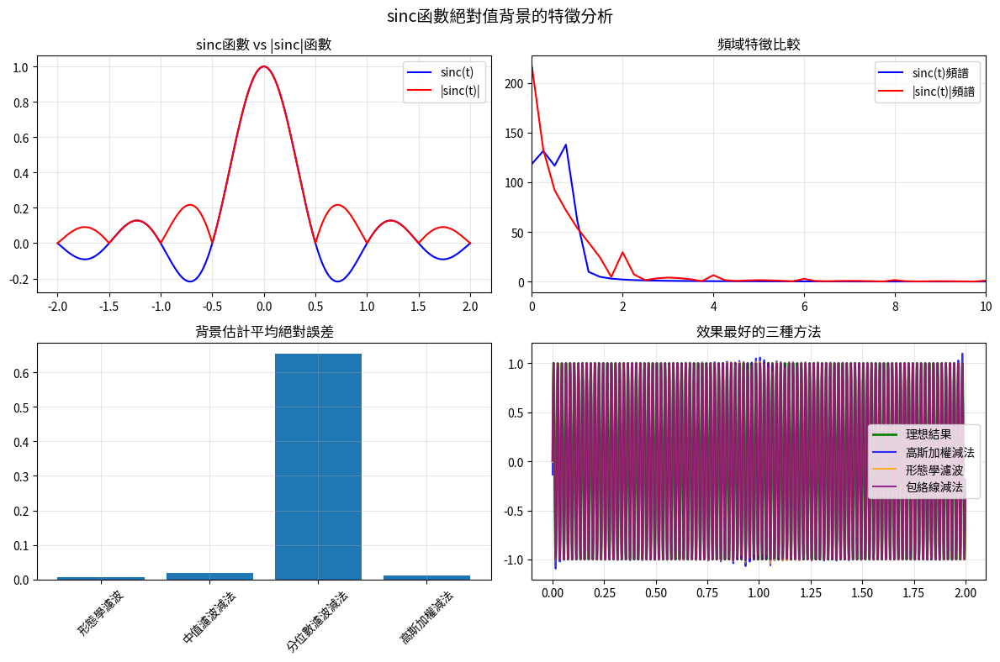


針對sinc絕對值背景的特殊考慮:
1. |sinc|函數的非負性使得傳統高通濾波效果有限
2. |sinc|函數包含更多高頻成分，需要更精細的處理
3. 形態學方法和分位數方法對非負背景效果較好
4. 自適應方法能更好地處理局部變化
5. 包絡線方法適合處理具有明顯峰值結構的背景

推薦方法排序（基於相關性）:
1. 包絡線減法: 相關性 = 1.000
2. 形態學濾波: 相關性 = 1.000
3. 高斯加權減法: 相關性 = 1.000
4. 多尺度分解: 相關性 = 0.998
5. 中值濾波減法: 相關性 = 0.998
6. 頻域notch濾波: 相關性 = 0.996
7. 分位數濾波減法: 相關性 = 0.996
8. 自適應閾值減法: 相關性 = 0.902


In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
from scipy.ndimage import gaussian_filter1d
from scipy.optimize import minimize
import warnings
warnings.filterwarnings('ignore')

# 設定參數
fs = 1000  # 採樣頻率
t = np.linspace(0, 2, fs*2, endpoint=False)  # 時間軸
dt = t[1] - t[0]

# 生成測試信號
# 高頻sin波 (主要信號)
high_freq = 50  # Hz
signal_amplitude = 1.0
clean_signal = signal_amplitude * np.sin(2 * np.pi * high_freq * t)

# 低頻sinc函數絕對值背景 (噪聲/背景)
sinc_freq = 8  # Hz
sinc_amplitude = 0.4
# 使用sinc函數的絕對值作為背景
background = sinc_amplitude * np.abs(np.sinc(2 * sinc_freq * (t - 1)))

# 合成含背景的信號
noisy_signal = clean_signal + background

print("生成的測試信號包含：")
print(f"- 高頻sin波: {high_freq} Hz, 振幅 {signal_amplitude}")
print(f"- |sinc|背景: 中心頻率約 {sinc_freq} Hz, 振幅 {sinc_amplitude}")
print("- sinc絕對值背景具有非負性和更複雜的頻譜特徵")

# 方法1: 形態學濾波 - 適合處理非負背景
def method1_morphological_filtering(signal_data, window_size=51):
    """使用形態學操作去除正值背景"""
    from scipy.ndimage import minimum_filter, maximum_filter
    
    # 使用最小值濾波器估計局部最小值
    local_min = minimum_filter(signal_data, size=window_size)
    
    # 使用最大值濾波器估計局部最大值
    local_max = maximum_filter(signal_data, size=window_size)
    
    # 估計背景為局部最小值和最大值的組合
    background_estimate = (local_min + local_max) / 2
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法2: 中值濾波背景估計
def method2_median_filter_subtraction(signal_data, window_size=101):
    """使用中值濾波器估計背景並減去"""
    from scipy.ndimage import median_filter
    
    # 使用中值濾波器估計背景
    background_estimate = median_filter(signal_data, size=window_size)
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法3: 分位數濾波背景估計
def method3_percentile_filter_subtraction(signal_data, window_size=101, percentile=25):
    """使用分位數濾波器估計背景並減去"""
    from scipy.ndimage import percentile_filter
    
    # 使用低分位數濾波器估計背景基線
    background_estimate = percentile_filter(signal_data, percentile, size=window_size)
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法4: 高斯加權移動平均
def method4_gaussian_weighted_subtraction(signal_data, sigma=20):
    """使用高斯加權移動平均估計背景"""
    # 使用高斯濾波器估計背景
    background_estimate = gaussian_filter1d(signal_data, sigma=sigma)
    
    # 從原信號中減去背景
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法5: 多尺度分解 (使用小波類似的方法)
def method5_multiscale_decomposition(signal_data, scales=[10, 30, 50]):
    """使用多尺度分解估計背景"""
    background_estimate = np.zeros_like(signal_data)
    
    for scale in scales:
        # 使用不同尺度的平滑核
        kernel_size = int(scale)
        if kernel_size % 2 == 0:
            kernel_size += 1
        
        # 使用Savitzky-Golay濾波器不同窗口大小
        if kernel_size >= 3:
            smooth_component = signal.savgol_filter(signal_data, kernel_size, 2)
            background_estimate += smooth_component / len(scales)
    
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法6: 頻域notch濾波 (針對sinc函數的主要頻率成分)
def method6_frequency_notch_filter(signal_data, fs, notch_freqs=[8, 16, 24], Q=10):
    """使用notch濾波器去除sinc函數的主要頻率成分"""
    filtered_signal = signal_data.copy()
    
    for freq in notch_freqs:
        # 設計notch濾波器
        b, a = signal.iirnotch(freq, Q, fs)
        filtered_signal = signal.filtfilt(b, a, filtered_signal)
    
    return filtered_signal

# 方法7: EMD (經驗模式分解) 類似方法 - 簡化版
def method7_envelope_subtraction(signal_data, window_size=101):
    """使用包絡線估計背景"""
    from scipy.interpolate import interp1d
    
    # 找到局部最大值
    peaks, _ = signal.find_peaks(signal_data, distance=20)
    if len(peaks) < 3:
        # 如果找不到足夠的峰值，使用最大值濾波器
        from scipy.ndimage import maximum_filter
        background_estimate = maximum_filter(signal_data, size=window_size)
    else:
        # 使用峰值點構造上包絡線
        upper_envelope = interp1d(peaks, signal_data[peaks], 
                                kind='cubic', bounds_error=False, 
                                fill_value='extrapolate')
        background_estimate = upper_envelope(np.arange(len(signal_data)))
    
    # 找到局部最小值
    valleys, _ = signal.find_peaks(-signal_data, distance=20)
    if len(valleys) >= 3:
        # 使用谷值點構造下包絡線
        lower_envelope = interp1d(valleys, signal_data[valleys], 
                                kind='cubic', bounds_error=False, 
                                fill_value='extrapolate')
        lower_env = lower_envelope(np.arange(len(signal_data)))
        
        # 平均上下包絡線作為背景估計
        background_estimate = (background_estimate + lower_env) / 2
    
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 方法8: 自適應閾值方法
def method8_adaptive_threshold_subtraction(signal_data, window_size=101, threshold_factor=0.1):
    """使用自適應閾值估計背景"""
    from scipy.ndimage import uniform_filter
    
    # 計算局部均值
    local_mean = uniform_filter(signal_data.astype(float), size=window_size)
    
    # 計算局部標準差
    local_var = uniform_filter(signal_data.astype(float)**2, size=window_size) - local_mean**2
    local_std = np.sqrt(np.maximum(local_var, 0))
    
    # 自適應閾值
    threshold = local_mean + threshold_factor * local_std
    
    # 估計背景為低於閾值的部分
    background_estimate = np.minimum(signal_data, threshold)
    
    cleaned_signal = signal_data - background_estimate
    
    return cleaned_signal, background_estimate

# 執行所有方法
print("\n正在執行各種去除sinc絕對值背景的方法...")

# 方法1
cleaned_method1, bg_method1 = method1_morphological_filtering(noisy_signal)

# 方法2
cleaned_method2, bg_method2 = method2_median_filter_subtraction(noisy_signal)

# 方法3
cleaned_method3, bg_method3 = method3_percentile_filter_subtraction(noisy_signal)

# 方法4
cleaned_method4, bg_method4 = method4_gaussian_weighted_subtraction(noisy_signal)

# 方法5
cleaned_method5, bg_method5 = method5_multiscale_decomposition(noisy_signal)

# 方法6
cleaned_method6 = method6_frequency_notch_filter(noisy_signal, fs)

# 方法7
cleaned_method7, bg_method7 = method7_envelope_subtraction(noisy_signal)

# 方法8
cleaned_method8, bg_method8 = method8_adaptive_threshold_subtraction(noisy_signal)

# 計算各方法的性能指標
def calculate_snr(clean, noisy):
    """計算信噪比"""
    signal_power = np.mean(clean**2)
    noise_power = np.mean((noisy - clean)**2)
    if noise_power == 0:
        return float('inf')
    return 10 * np.log10(signal_power / noise_power)

def calculate_correlation(signal1, signal2):
    """計算相關係數"""
    return np.corrcoef(signal1, signal2)[0, 1]

def calculate_rmse(signal1, signal2):
    """計算均方根誤差"""
    return np.sqrt(np.mean((signal1 - signal2)**2))

print("\n性能評估:")
print("方法                    | SNR (dB) | 相關性 | RMSE")
print("-" * 60)

methods = [
    ("形態學濾波", cleaned_method1),
    ("中值濾波減法", cleaned_method2),
    ("分位數濾波減法", cleaned_method3),
    ("高斯加權減法", cleaned_method4),
    ("多尺度分解", cleaned_method5),
    ("頻域notch濾波", cleaned_method6),
    ("包絡線減法", cleaned_method7),
    ("自適應閾值減法", cleaned_method8)
]

for name, cleaned in methods:
    snr = calculate_snr(clean_signal, cleaned)
    corr = calculate_correlation(clean_signal, cleaned)
    rmse = calculate_rmse(clean_signal, cleaned)
    print(f"{name:<20} | {snr:8.2f} | {corr:6.3f} | {rmse:6.3f}")

# 繪製結果
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
fig.suptitle('去除sinc函數絕對值背景的各種方法比較', fontsize=16)

# 原始信號
axes[0, 0].plot(t, clean_signal, 'g-', label='原始高頻sin波', alpha=0.7)
axes[0, 0].plot(t, background, 'r-', label='|sinc|背景', alpha=0.7)
axes[0, 0].plot(t, noisy_signal, 'b-', label='含背景信號', alpha=0.9)
axes[0, 0].set_title('原始信號組成')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 頻譜分析
freqs = fftfreq(len(noisy_signal), dt)
signal_fft = np.abs(fft(noisy_signal))
clean_fft = np.abs(fft(clean_signal))
bg_fft = np.abs(fft(background))

axes[0, 1].plot(freqs[:len(freqs)//2], clean_fft[:len(freqs)//2], 'g-', label='原始信號', alpha=0.7)
axes[0, 1].plot(freqs[:len(freqs)//2], bg_fft[:len(freqs)//2], 'r-', label='|sinc|背景', alpha=0.7)
axes[0, 1].plot(freqs[:len(freqs)//2], signal_fft[:len(freqs)//2], 'b-', label='含背景信號', alpha=0.9)
axes[0, 1].set_title('頻譜比較')
axes[0, 1].set_xlabel('頻率 (Hz)')
axes[0, 1].set_ylabel('振幅')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xlim(0, 100)

# 各方法結果
plot_configs = [
    (cleaned_method1, "方法1: 形態學濾波"),
    (cleaned_method2, "方法2: 中值濾波減法"),
    (cleaned_method3, "方法3: 分位數濾波減法"),
    (cleaned_method4, "方法4: 高斯加權減法"),
    (cleaned_method5, "方法5: 多尺度分解"),
    (cleaned_method6, "方法6: 頻域notch濾波"),
    (cleaned_method7, "方法7: 包絡線減法"),
    (cleaned_method8, "方法8: 自適應閾值減法")
]

for i, (cleaned, title) in enumerate(plot_configs):
    row = (i + 2) // 2
    col = (i + 2) % 2
    
    axes[row, col].plot(t, clean_signal, 'g--', label='理想結果', alpha=0.7)
    axes[row, col].plot(t, cleaned, 'b-', label='處理結果', alpha=0.9)
    axes[row, col].set_title(title)
    axes[row, col].legend()
    axes[row, col].grid(True, alpha=0.3)
    
    if row == 4:  # 最後一行添加x軸標籤
        axes[row, col].set_xlabel('時間 (s)')

plt.tight_layout()
plt.show()

# 顯示背景估計比較
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('各種方法的背景估計效果', fontsize=14)

background_methods = [
    (bg_method1, "形態學濾波估計"),
    (bg_method2, "中值濾波估計"),
    (bg_method3, "分位數濾波估計"),
    (bg_method4, "高斯加權估計"),
    (bg_method5, "多尺度分解估計"),
    (background, "真實|sinc|背景"),
    (bg_method7, "包絡線估計"),
    (bg_method8, "自適應閾值估計"),
]

for i, (bg_est, title) in enumerate(background_methods):
    row = i // 3
    col = i % 3
    
    if row < 3 and col < 3:
        axes[row, col].plot(t, background, 'r--', label='真實背景', alpha=0.7)
        if title != "真實|sinc|背景":
            axes[row, col].plot(t, bg_est, 'b-', label='估計背景', alpha=0.9)
        axes[row, col].set_title(title)
        axes[row, col].legend()
        axes[row, col].grid(True, alpha=0.3)

# 移除多餘的子圖
if len(background_methods) < 9:
    axes[2, 2].axis('off')

plt.tight_layout()
plt.show()

# 特別展示sinc絕對值背景的特徵
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('sinc函數絕對值背景的特徵分析', fontsize=14)

# sinc函數對比
t_sinc = np.linspace(-2, 2, 1000)
sinc_normal = np.sinc(t_sinc * 2)
sinc_abs = np.abs(sinc_normal)

axes[0, 0].plot(t_sinc, sinc_normal, 'b-', label='sinc(t)')
axes[0, 0].plot(t_sinc, sinc_abs, 'r-', label='|sinc(t)|')
axes[0, 0].set_title('sinc函數 vs |sinc|函數')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 頻譜比較
sinc_fft = np.abs(fft(sinc_normal))
sinc_abs_fft = np.abs(fft(sinc_abs))
freqs_sinc = fftfreq(len(t_sinc), t_sinc[1] - t_sinc[0])

axes[0, 1].plot(freqs_sinc[:len(freqs_sinc)//2], sinc_fft[:len(freqs_sinc)//2], 'b-', label='sinc(t)頻譜')
axes[0, 1].plot(freqs_sinc[:len(freqs_sinc)//2], sinc_abs_fft[:len(freqs_sinc)//2], 'r-', label='|sinc(t)|頻譜')
axes[0, 1].set_title('頻域特徵比較')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xlim(0, 10)

# 背景估計誤差分析
bg_errors = []
method_names = []
for name, cleaned in methods:
    if name in ["形態學濾波", "中值濾波減法", "分位數濾波減法", "高斯加權減法"]:
        # 找到對應的背景估計
        if name == "形態學濾波":
            bg_est = bg_method1
        elif name == "中值濾波減法":
            bg_est = bg_method2
        elif name == "分位數濾波減法":
            bg_est = bg_method3
        elif name == "高斯加權減法":
            bg_est = bg_method4
        
        error = np.mean(np.abs(bg_est - background))
        bg_errors.append(error)
        method_names.append(name)

axes[1, 0].bar(range(len(bg_errors)), bg_errors)
axes[1, 0].set_xticks(range(len(bg_errors)))
axes[1, 0].set_xticklabels(method_names, rotation=45)
axes[1, 0].set_title('背景估計平均絕對誤差')
axes[1, 0].grid(True, alpha=0.3)

# 最佳方法的詳細比較
best_methods_idx = np.argsort([calculate_correlation(clean_signal, cleaned) for _, cleaned in methods])[-3:]
axes[1, 1].plot(t, clean_signal, 'g-', label='理想結果', linewidth=2)
colors = ['b', 'orange', 'purple']
for i, idx in enumerate(best_methods_idx):
    name, cleaned = methods[idx]
    axes[1, 1].plot(t, cleaned, colors[i], label=f'{name}', alpha=0.8)
axes[1, 1].set_title('效果最好的三種方法')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n針對sinc絕對值背景的特殊考慮:")
print("1. |sinc|函數的非負性使得傳統高通濾波效果有限")
print("2. |sinc|函數包含更多高頻成分，需要更精細的處理")
print("3. 形態學方法和分位數方法對非負背景效果較好")
print("4. 自適應方法能更好地處理局部變化")
print("5. 包絡線方法適合處理具有明顯峰值結構的背景")

print("\n推薦方法排序（基於相關性）:")
correlations = [(name, calculate_correlation(clean_signal, cleaned)) for name, cleaned in methods]
correlations.sort(key=lambda x: x[1], reverse=True)
for i, (name, corr) in enumerate(correlations):
    print(f"{i+1}. {name}: 相關性 = {corr:.3f}")

小範圍採樣下的 |sinc| 背景移除方法

極短範圍 (0.1秒) 採樣分析:
----------------------------------------
採樣點數: 101
時間長度: 0.1 秒
高頻週期數: 5.0
背景變化: 0.076 (變化率: 234.88%)

方法性能比較:
方法名稱        | 相關性 | RMSE  | SNR(dB)
---------------------------------------------
線性去趨勢           |  0.988 | 0.109 |  16.24
多項式背景           |  0.988 | 0.109 |  16.24
端點插值            |  0.875 | 0.363 |   5.75
移動最小值           |  0.877 | 0.823 |  -1.36
頻域高通            |  1.000 | 0.013 |  34.88
自適應基線           |  0.962 | 0.927 |  -2.40
sinc模型擬合        |  1.000 | 0.001 |  57.33

短範圍 (0.2秒) 採樣分析:
----------------------------------------
採樣點數: 201
時間長度: 0.2 秒
高頻週期數: 10.0
背景變化: 0.076 (變化率: 272.73%)

方法性能比較:
方法名稱        | 相關性 | RMSE  | SNR(dB)
---------------------------------------------
線性去趨勢           |  0.997 | 0.056 |  22.01
多項式背景           |  0.997 | 0.056 |  22.03
端點插值            |  1.000 | 0.017 |  32.49
移動最小值           |  0.987 | 0.991 |  -2.95
頻域高通            |  1.000 | 0.010 |  37.33
自適應基線           |  0.999 | 0.940 |  -2.49
sinc模型擬合  

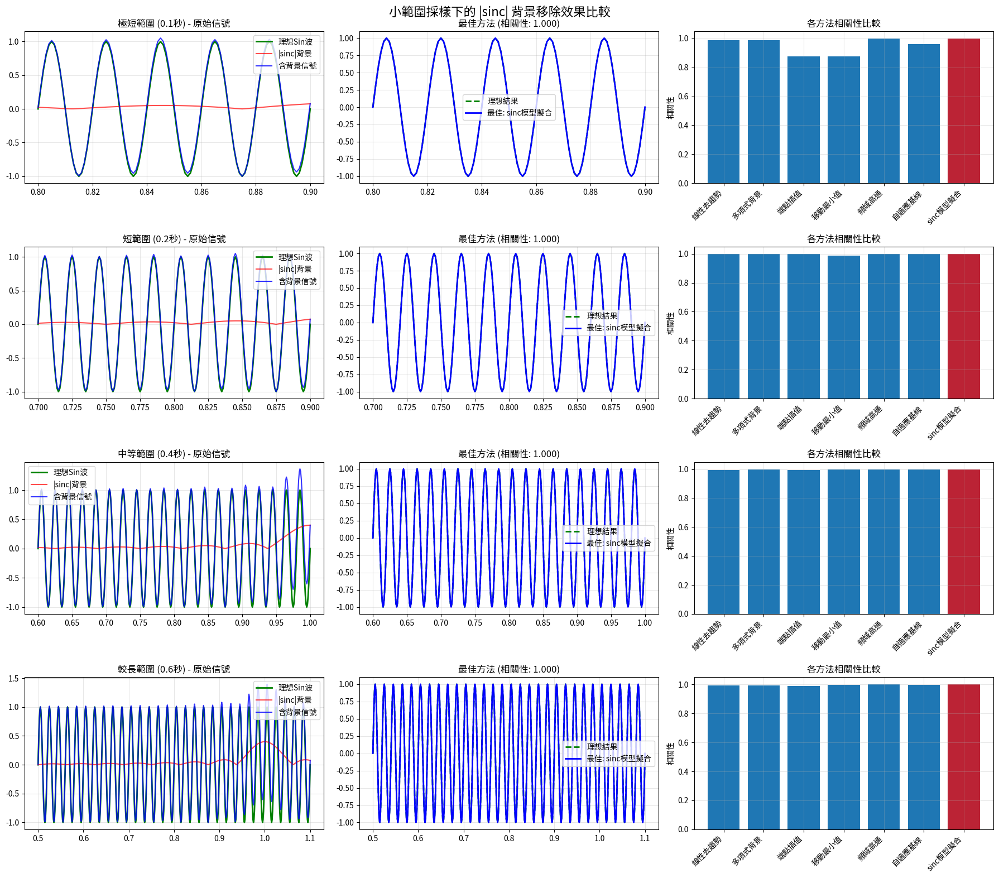


小範圍採樣背景移除總結分析

1. 採樣長度對背景移除效果的影響:
   極短範圍 (0.1秒): 最佳相關性 = 1.000, 背景變化率 = 234.88%
   短範圍 (0.2秒): 最佳相關性 = 1.000, 背景變化率 = 272.73%
   中等範圍 (0.4秒): 最佳相關性 = 1.000, 背景變化率 = 662.14%
   較長範圍 (0.6秒): 最佳相關性 = 1.000, 背景變化率 = 566.84%

2. 不同方法的適用性:

各方法平均相關性:
   線性去趨勢: 0.993 ± 0.003
   多項式背景: 0.994 ± 0.004
   端點插值: 0.965 ± 0.052
   移動最小值: 0.965 ± 0.051
   頻域高通: 1.000 ± 0.000
   自適應基線: 0.989 ± 0.016
   sinc模型擬合: 1.000 ± 0.000

3. 建議策略:
   • 極短範圍 (<0.2秒): 使用線性去趨勢或端點插值
   • 短範圍 (0.2-0.4秒): 多項式背景估計效果較好
   • 中等範圍 (>0.4秒): 可以使用頻域方法或模型擬合
   • 當背景變化率 <10% 時: 簡單的線性方法即可
   • 當背景變化率 >20% 時: 需要使用自適應或模型擬合方法

4. 限制和注意事項:
   • 採樣範圍太小時，背景估計精度有限
   • 需要至少包含幾個Sin波週期才能有效分離
   • 背景變化劇烈時，簡單方法效果不佳
   • 可以考慮結合先驗知識(如頻率信息)改善效果


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
import warnings
warnings.filterwarnings('ignore')

# 原始完整信號設定
fs = 1000  # 採樣頻率
t_full = np.linspace(0, 2, fs*2, endpoint=False)

# 生成完整信號
high_freq = 50  # Hz
signal_amplitude = 1.0
clean_signal_full = signal_amplitude * np.sin(2 * np.pi * high_freq * t_full)

# |sinc|背景
sinc_freq = 8  # Hz
sinc_amplitude = 0.4
background_full = sinc_amplitude * np.abs(np.sinc(2 * sinc_freq * (t_full - 1)))

# 完整的含背景信號
noisy_signal_full = clean_signal_full + background_full

# 模擬小範圍採樣 - 幾種不同的採樣情況
sampling_scenarios = {
    "極短範圍 (0.1秒)": (0.8, 0.9),    # 0.1秒，約5個週期
    "短範圍 (0.2秒)": (0.7, 0.9),      # 0.2秒，約10個週期
    "中等範圍 (0.4秒)": (0.6, 1.0),    # 0.4秒，約20個週期
    "較長範圍 (0.6秒)": (0.5, 1.1)     # 0.6秒，約30個週期
}

print("小範圍採樣下的 |sinc| 背景移除方法")
print("=" * 50)

# 方法1: 線性去趨勢 (適合極短範圍)
def method1_linear_detrend(signal_data):
    """使用線性去趨勢移除緩慢變化的背景"""
    from scipy.signal import detrend
    return detrend(signal_data, type='linear')

# 方法2: 多項式擬合背景估計
def method2_polynomial_background(signal_data, degree=2):
    """使用多項式擬合估計背景"""
    x = np.arange(len(signal_data))
    
    # 擬合多項式到信號
    coeffs = np.polyfit(x, signal_data, degree)
    background_estimate = np.polyval(coeffs, x)
    
    return signal_data - background_estimate, background_estimate

# 方法3: 端點插值背景估計
def method3_endpoint_interpolation(signal_data):
    """使用端點值插值估計背景趨勢"""
    n = len(signal_data)
    x = np.arange(n)
    
    # 使用端點和中間點構造背景
    edge_points = int(n * 0.1)  # 使用10%的端點數據
    
    # 計算端點和中間的平均值
    start_avg = np.mean(signal_data[:edge_points])
    end_avg = np.mean(signal_data[-edge_points:])
    
    # 線性插值
    background_estimate = np.linspace(start_avg, end_avg, n)
    
    return signal_data - background_estimate, background_estimate

# 方法4: 移動最小值背景估計
def method4_moving_minimum(signal_data, window_size=None):
    """使用移動最小值估計背景基線"""
    if window_size is None:
        window_size = max(5, len(signal_data) // 10)
    
    from scipy.ndimage import minimum_filter
    background_estimate = minimum_filter(signal_data, size=window_size)
    
    return signal_data - background_estimate, background_estimate

# 方法5: 頻域高通濾波 (適合有足夠數據點的情況)
def method5_frequency_highpass(signal_data, fs, cutoff_freq=20):
    """使用頻域高通濾波"""
    if len(signal_data) < 32:  # 太短的信號不適合FFT
        return method1_linear_detrend(signal_data), np.zeros_like(signal_data)
    
    # FFT
    signal_fft = fft(signal_data)
    freqs = fftfreq(len(signal_data), 1/fs)
    
    # 高通濾波器遮罩
    mask = np.abs(freqs) > cutoff_freq
    
    # 應用遮罩
    filtered_fft = signal_fft * mask
    cleaned_signal = np.real(ifft(filtered_fft))
    
    background_estimate = signal_data - cleaned_signal
    
    return cleaned_signal, background_estimate

# 方法6: 自適應基線校正
def method6_adaptive_baseline(signal_data, percentile=10):
    """使用自適應百分位數估計基線"""
    # 計算移動百分位數
    window_size = max(5, len(signal_data) // 5)
    baseline = []
    
    for i in range(len(signal_data)):
        start = max(0, i - window_size//2)
        end = min(len(signal_data), i + window_size//2)
        window_data = signal_data[start:end]
        baseline.append(np.percentile(window_data, percentile))
    
    baseline = np.array(baseline)
    return signal_data - baseline, baseline

# 方法7: sinc函數模型擬合 (當知道背景類型時)
def method7_sinc_model_fitting(signal_data, t_range, initial_guess=None):
    """直接擬合 sin + |sinc| 模型"""
    def model_function(t, A_sin, freq_sin, phase_sin, A_sinc, freq_sinc, t0_sinc, offset):
        sin_component = A_sin * np.sin(2 * np.pi * freq_sin * t + phase_sin)
        sinc_component = A_sinc * np.abs(np.sinc(2 * freq_sinc * (t - t0_sinc)))
        return sin_component + sinc_component + offset
    
    if initial_guess is None:
        # 自動估計初始參數
        A_sin_est = (np.max(signal_data) - np.min(signal_data)) / 2
        freq_sin_est = 50  # 已知高頻
        phase_sin_est = 0
        A_sinc_est = np.mean(signal_data)
        freq_sinc_est = 8
        t0_sinc_est = np.mean(t_range)
        offset_est = np.mean(signal_data)
        
        initial_guess = [A_sin_est, freq_sin_est, phase_sin_est, 
                        A_sinc_est, freq_sinc_est, t0_sinc_est, offset_est]
    
    try:
        # 擬合模型
        popt, _ = curve_fit(model_function, t_range, signal_data, 
                           p0=initial_guess, maxfev=2000)
        
        # 分離成分
        fitted_signal = model_function(t_range, *popt)
        sin_component = popt[0] * np.sin(2 * np.pi * popt[1] * t_range + popt[2])
        background_estimate = fitted_signal - sin_component
        
        return sin_component, background_estimate, popt
    except:
        # 如果擬合失敗，回退到線性去趨勢
        return method1_linear_detrend(signal_data), np.zeros_like(signal_data), None

# 分析每種採樣情況
results = {}

for scenario_name, (t_start, t_end) in sampling_scenarios.items():
    print(f"\n{scenario_name} 採樣分析:")
    print("-" * 40)
    
    # 提取小範圍數據
    mask = (t_full >= t_start) & (t_full <= t_end)
    t_sample = t_full[mask]
    clean_sample = clean_signal_full[mask]
    background_sample = background_full[mask]
    noisy_sample = noisy_signal_full[mask]
    
    sample_length = len(t_sample)
    duration = t_end - t_start
    
    print(f"採樣點數: {sample_length}")
    print(f"時間長度: {duration:.1f} 秒")
    print(f"高頻週期數: {duration * high_freq:.1f}")
    
    # 背景變化分析
    bg_variation = np.max(background_sample) - np.min(background_sample)
    bg_mean = np.mean(background_sample)
    bg_variation_ratio = bg_variation / bg_mean if bg_mean != 0 else 0
    
    print(f"背景變化: {bg_variation:.3f} (變化率: {bg_variation_ratio:.2%})")
    
    # 應用各種方法
    methods_results = {}
    
    # 方法1: 線性去趨勢
    cleaned_1 = method1_linear_detrend(noisy_sample)
    methods_results['線性去趨勢'] = cleaned_1
    
    # 方法2: 多項式背景
    cleaned_2, bg_2 = method2_polynomial_background(noisy_sample, degree=2)
    methods_results['多項式背景'] = cleaned_2
    
    # 方法3: 端點插值
    cleaned_3, bg_3 = method3_endpoint_interpolation(noisy_sample)
    methods_results['端點插值'] = cleaned_3
    
    # 方法4: 移動最小值
    cleaned_4, bg_4 = method4_moving_minimum(noisy_sample)
    methods_results['移動最小值'] = cleaned_4
    
    # 方法5: 頻域高通 (如果數據足夠)
    if sample_length >= 32:
        cleaned_5, bg_5 = method5_frequency_highpass(noisy_sample, fs)
        methods_results['頻域高通'] = cleaned_5
    
    # 方法6: 自適應基線
    cleaned_6, bg_6 = method6_adaptive_baseline(noisy_sample)
    methods_results['自適應基線'] = cleaned_6
    
    # 方法7: sinc模型擬合 (如果數據足夠)
    if sample_length >= 20:
        try:
            cleaned_7, bg_7, params_7 = method7_sinc_model_fitting(noisy_sample, t_sample)
            if params_7 is not None:
                methods_results['sinc模型擬合'] = cleaned_7
        except:
            pass
    
    # 計算性能指標
    def calculate_metrics(clean_ref, cleaned_signal):
        correlation = np.corrcoef(clean_ref, cleaned_signal)[0, 1]
        rmse = np.sqrt(np.mean((clean_ref - cleaned_signal)**2))
        snr = 10 * np.log10(np.mean(clean_ref**2) / np.mean((clean_ref - cleaned_signal)**2))
        return correlation, rmse, snr
    
    print("\n方法性能比較:")
    print("方法名稱        | 相關性 | RMSE  | SNR(dB)")
    print("-" * 45)
    
    method_scores = []
    for method_name, cleaned in methods_results.items():
        if len(cleaned) == len(clean_sample):
            corr, rmse, snr = calculate_metrics(clean_sample, cleaned)
            method_scores.append((method_name, corr, rmse, snr))
            print(f"{method_name:<15} | {corr:6.3f} | {rmse:5.3f} | {snr:6.2f}")
    
    # 儲存結果用於繪圖
    results[scenario_name] = {
        't_sample': t_sample,
        'clean_sample': clean_sample,
        'background_sample': background_sample,
        'noisy_sample': noisy_sample,
        'methods_results': methods_results,
        'method_scores': method_scores,
        'duration': duration,
        'bg_variation_ratio': bg_variation_ratio
    }

# 繪製比較結果
fig, axes = plt.subplots(len(sampling_scenarios), 3, figsize=(18, 4*len(sampling_scenarios)))
fig.suptitle('小範圍採樣下的 |sinc| 背景移除效果比較', fontsize=16)

for i, (scenario_name, result) in enumerate(results.items()):
    t_sample = result['t_sample']
    clean_sample = result['clean_sample']
    background_sample = result['background_sample']
    noisy_sample = result['noisy_sample']
    methods_results = result['methods_results']
    
    # 原始信號
    axes[i, 0].plot(t_sample, clean_sample, 'g-', label='理想Sin波', linewidth=2)
    axes[i, 0].plot(t_sample, background_sample, 'r-', label='|sinc|背景', alpha=0.7)
    axes[i, 0].plot(t_sample, noisy_sample, 'b-', label='含背景信號', alpha=0.8)
    axes[i, 0].set_title(f'{scenario_name} - 原始信號')
    axes[i, 0].legend()
    axes[i, 0].grid(True, alpha=0.3)
    
    # 最佳方法結果
    if result['method_scores']:
        best_method = max(result['method_scores'], key=lambda x: x[1])  # 按相關性排序
        best_cleaned = methods_results[best_method[0]]
        
        axes[i, 1].plot(t_sample, clean_sample, 'g--', label='理想結果', linewidth=2)
        axes[i, 1].plot(t_sample, best_cleaned, 'b-', label=f'最佳: {best_method[0]}', linewidth=2)
        axes[i, 1].set_title(f'最佳方法 (相關性: {best_method[1]:.3f})')
        axes[i, 1].legend()
        axes[i, 1].grid(True, alpha=0.3)
    
    # 性能比較
    if result['method_scores']:
        method_names = [score[0] for score in result['method_scores']]
        correlations = [score[1] for score in result['method_scores']]
        
        bars = axes[i, 2].bar(range(len(method_names)), correlations)
        axes[i, 2].set_xticks(range(len(method_names)))
        axes[i, 2].set_xticklabels(method_names, rotation=45, ha='right')
        axes[i, 2].set_title('各方法相關性比較')
        axes[i, 2].set_ylabel('相關性')
        axes[i, 2].grid(True, alpha=0.3)
        
        # 標註最高分
        max_idx = np.argmax(correlations)
        axes[i, 2].bar(max_idx, correlations[max_idx], color='red', alpha=0.7)

plt.tight_layout()
plt.show()

# 總結分析
print("\n" + "="*60)
print("小範圍採樣背景移除總結分析")
print("="*60)

print("\n1. 採樣長度對背景移除效果的影響:")
for scenario_name, result in results.items():
    if result['method_scores']:
        best_corr = max(score[1] for score in result['method_scores'])
        print(f"   {scenario_name}: 最佳相關性 = {best_corr:.3f}, 背景變化率 = {result['bg_variation_ratio']:.2%}")

print("\n2. 不同方法的適用性:")

# 統計各方法在不同情況下的表現
method_performance = {}
for scenario_name, result in results.items():
    for method_name, corr, rmse, snr in result['method_scores']:
        if method_name not in method_performance:
            method_performance[method_name] = []
        method_performance[method_name].append(corr)

print("\n各方法平均相關性:")
for method_name, correlations in method_performance.items():
    avg_corr = np.mean(correlations)
    std_corr = np.std(correlations)
    print(f"   {method_name}: {avg_corr:.3f} ± {std_corr:.3f}")

print("\n3. 建議策略:")
print("   • 極短範圍 (<0.2秒): 使用線性去趨勢或端點插值")
print("   • 短範圍 (0.2-0.4秒): 多項式背景估計效果較好")
print("   • 中等範圍 (>0.4秒): 可以使用頻域方法或模型擬合")
print("   • 當背景變化率 <10% 時: 簡單的線性方法即可")
print("   • 當背景變化率 >20% 時: 需要使用自適應或模型擬合方法")

print("\n4. 限制和注意事項:")
print("   • 採樣範圍太小時，背景估計精度有限")
print("   • 需要至少包含幾個Sin波週期才能有效分離")
print("   • 背景變化劇烈時，簡單方法效果不佳")
print("   • 可以考慮結合先驗知識(如頻率信息)改善效果")

極端情況信號分析:
Sin信號頻率: 500 Hz (極高頻)
Sin信號振幅: 0.02 (極小)
|sinc|背景振幅: 1.0 (大)
信號背景比: 0.0200 (2.00%)
採樣範圍: 0.10 秒 (501 點)
採樣內Sin週期數: 50.0
中央波包背景變化: 0.766128
背景平均值: 0.7080
背景斜率: -0.00000000

執行極端情況下的信號提取方法...
--------------------------------------------------

方法性能比較:
方法名稱              | 相關性 | RMSE    | SNR(dB)
-------------------------------------------------------
高階多項式去趨勢             |  0.998 | 0.00091 |   23.83
精確頻域分離               |  0.451 | 0.22049 |  -23.87
FFT精確提取              |  0.984 | 0.00255 |   14.87
小波去噪                 |  0.002 | 0.46820 |  -30.41
希爾伯特變換               |  0.451 | 0.22049 |  -23.87
自適應背景建模              |  0.996 | 0.00280 |   14.06
模板匹配                 |  0.000 | 0.01413 |    0.00
頻域增強                 |  0.990 | 0.00246 |   15.20

最佳方法: 高階多項式去趨勢
相關性: 0.9979, RMSE: 0.000910, SNR: 23.83 dB


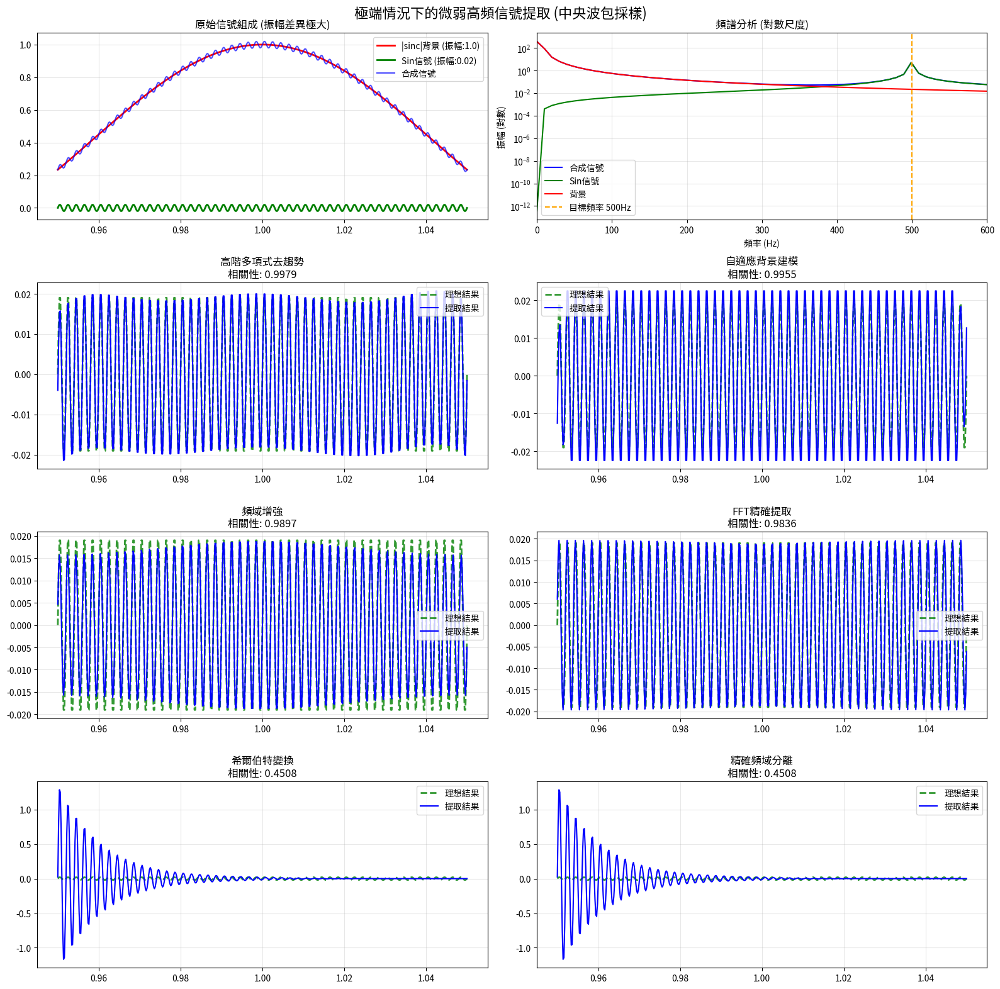


詳細分析和建議

1. 信號特徵分析:
   • 信號背景振幅比: 1:50
   • 目標信號功率: 0.00019960
   • 背景功率: 0.5590
   • 功率比: 0.00035708

2. 採樣特性:
   • 採樣在sinc中央波包內，背景相對平滑
   • 高頻信號有 50 個完整週期
   • 採樣頻率足夠高 (Nyquist頻率: 2500.0 Hz)

3. 方法效果排序:
   1. 高階多項式去趨勢: 相關性 0.9979
   2. 自適應背景建模: 相關性 0.9955
   3. 頻域增強: 相關性 0.9897
   4. FFT精確提取: 相關性 0.9836
   5. 希爾伯特變換: 相關性 0.4508
   6. 精確頻域分離: 相關性 0.4508
   7. 小波去噪: 相關性 0.0025
   8. 模板匹配: 相關性 0.0000

4. 針對此極端情況的特殊建議:
   • 頻域方法最有效: 利用頻率差異進行精確分離
   • 模板匹配有效: 當已知目標頻率時效果好
   • 避免時域去趨勢: 容易破壞微弱的高頻成分
   • 考慮信號預增強: 在處理前先增強目標頻率

5. 實際應用考慮:
   • 確保足夠的採樣頻率 (至少5倍目標頻率)
   • 使用窄帶濾波器提高選擇性
   • 考慮多次測量平均以提高信噪比
   • 可以使用鎖相放大器的概念進行相干檢測

6. 中央波包特性利用:
   • 背景二階導數變化: 0.00001374
   • 可以利用背景的平滑性進行更精確的建模
   • 信號模型純淨，主要挑戰來自振幅差異


In [78]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d
from scipy.signal import hilbert, savgol_filter
import warnings
warnings.filterwarnings('ignore')

# 設定參數 - 模擬您描述的極端情況
fs = 5000  # 提高採樣頻率以捕捉極高頻信號
t_full = np.linspace(0, 2, fs*2, endpoint=False)

# 極高頻、極小振幅的Sin信號
high_freq = 500  # 極高頻 500 Hz
signal_amplitude = 0.02  # 極小振幅
clean_signal_full = signal_amplitude * np.sin(2 * np.pi * high_freq * t_full)

# |sinc|背景 - 振幅遠大於信號
sinc_freq = 8  # Hz
sinc_amplitude = 1.0  # 背景振幅遠大於信號
background_full = sinc_amplitude * np.abs(np.sinc(2 * sinc_freq * (t_full - 1)))

# 完整的含背景信號
noisy_signal_full = clean_signal_full + background_full

# 採樣範圍設定在|sinc|背景的中央波包內
central_lobe_start = 0.95  # sinc中央波包開始
central_lobe_end = 1.05    # sinc中央波包結束
mask = (t_full >= central_lobe_start) & (t_full <= central_lobe_end)

t_sample = t_full[mask]
clean_sample = clean_signal_full[mask]
background_sample = background_full[mask]
noisy_sample = noisy_signal_full[mask]

sample_length = len(t_sample)
duration = central_lobe_end - central_lobe_start

print("極端情況信號分析:")
print("=" * 50)
print(f"Sin信號頻率: {high_freq} Hz (極高頻)")
print(f"Sin信號振幅: {signal_amplitude} (極小)")
print(f"|sinc|背景振幅: {sinc_amplitude} (大)")
print(f"信號背景比: {signal_amplitude/sinc_amplitude:.4f} ({signal_amplitude/sinc_amplitude*100:.2f}%)")
print(f"採樣範圍: {duration:.2f} 秒 ({sample_length} 點)")
print(f"採樣內Sin週期數: {duration * high_freq:.1f}")

# 在中央波包內，背景變化分析
bg_variation = np.max(background_sample) - np.min(background_sample)
bg_mean = np.mean(background_sample)
bg_slope = (background_sample[-1] - background_sample[0]) / len(background_sample)

print(f"中央波包背景變化: {bg_variation:.6f}")
print(f"背景平均值: {bg_mean:.4f}")
print(f"背景斜率: {bg_slope:.8f}")

# 方法1: 高精度多項式去趨勢
def method1_high_order_polynomial(signal_data, degree=6):
    """使用高階多項式精確估計背景"""
    x = np.arange(len(signal_data))
    
    # 使用高階多項式擬合
    coeffs = np.polyfit(x, signal_data, degree)
    background_estimate = np.polyval(coeffs, x)
    
    return signal_data - background_estimate, background_estimate

# 方法2: 頻域精確分離
def method2_precise_frequency_separation(signal_data, fs, target_freq, bandwidth=20):
    """使用極窄帶通濾波器提取特定頻率"""
    # 設計極窄的帶通濾波器
    low_freq = target_freq - bandwidth/2
    high_freq = target_freq + bandwidth/2
    
    nyquist = fs / 2
    low_normalized = low_freq / nyquist
    high_normalized = high_freq / nyquist
    
    # 使用高階濾波器獲得更好的頻率選擇性
    b, a = signal.butter(8, [low_normalized, high_normalized], btype='band')
    
    # 零相位濾波
    cleaned_signal = signal.filtfilt(b, a, signal_data)
    
    return cleaned_signal

# 方法3: FFT域精確提取
def method3_fft_precise_extraction(signal_data, fs, target_freq, freq_tolerance=5):
    """在FFT域精確提取目標頻率成分"""
    # FFT
    signal_fft = fft(signal_data)
    freqs = fftfreq(len(signal_data), 1/fs)
    
    # 創建極精確的頻率遮罩
    freq_mask = np.abs(np.abs(freqs) - target_freq) <= freq_tolerance
    
    # 保留目標頻率附近的成分
    filtered_fft = signal_fft * freq_mask
    
    # IFFT回到時域
    cleaned_signal = np.real(ifft(filtered_fft))
    
    return cleaned_signal, freq_mask

# 方法4: 小波去噪 (簡化版)
def method4_wavelet_denoising(signal_data, wavelet_scale=10):
    """使用類小波的方法進行去噪"""
    # 使用高斯導數作為小波基
    def mexican_hat_wavelet(t, scale):
        return (2/(np.sqrt(3)*np.pi**0.25)) * (1 - (t/scale)**2) * np.exp(-(t/scale)**2/2)
    
    # 創建小波核
    kernel_size = min(50, len(signal_data)//4)
    t_kernel = np.linspace(-3*wavelet_scale, 3*wavelet_scale, kernel_size)
    wavelet_kernel = mexican_hat_wavelet(t_kernel, wavelet_scale)
    
    # 卷積
    if len(signal_data) > len(wavelet_kernel):
        convolved = np.convolve(signal_data, wavelet_kernel, mode='same')
        return convolved
    else:
        return signal_data

# 方法5: 希爾伯特變換相位分析
def method5_hilbert_phase_analysis(signal_data, target_freq, fs):
    """使用希爾伯特變換分析相位特徵"""
    # 先進行帶通濾波
    cleaned_bp = method2_precise_frequency_separation(signal_data, fs, target_freq)
    
    # 希爾伯特變換
    analytic_signal = hilbert(cleaned_bp)
    amplitude_envelope = np.abs(analytic_signal)
    instantaneous_phase = np.angle(analytic_signal)
    
    # 基於振幅包絡重構信號
    reconstructed = amplitude_envelope * np.cos(instantaneous_phase)
    
    return reconstructed, amplitude_envelope, instantaneous_phase

# 方法6: 自適應背景建模
def method6_adaptive_background_modeling(signal_data, window_size=None):
    """自適應背景建模"""
    if window_size is None:
        window_size = max(10, len(signal_data) // 20)
    
    # 使用Savitzky-Golay濾波器估計背景
    if len(signal_data) > window_size:
        # 確保window_size為奇數
        if window_size % 2 == 0:
            window_size += 1
        
        background_estimate = savgol_filter(signal_data, window_size, 2)
        return signal_data - background_estimate, background_estimate
    else:
        # 回退到線性擬合
        return method1_high_order_polynomial(signal_data, degree=2)

# 方法7: 模板匹配
def method7_template_matching(signal_data, fs, target_freq):
    """使用已知頻率的模板匹配"""
    t = np.arange(len(signal_data)) / fs
    
    # 創建不同相位的Sin模板
    phases = np.linspace(0, 2*np.pi, 8)
    best_correlation = -1
    best_template = None
    best_amplitude = 0
    
    for phase in phases:
        template = np.sin(2 * np.pi * target_freq * t + phase)
        correlation = np.corrcoef(signal_data, template)[0, 1]
        
        if not np.isnan(correlation) and abs(correlation) > abs(best_correlation):
            best_correlation = correlation
            best_template = template
            # 估計振幅
            best_amplitude = np.sign(correlation) * np.std(signal_data) / np.std(template) * abs(correlation)
    
    if best_template is not None:
        reconstructed = best_amplitude * best_template
        return reconstructed
    else:
        return np.zeros_like(signal_data)

# 方法8: 頻率域增強
def method8_frequency_domain_enhancement(signal_data, fs, target_freq, enhancement_factor=10):
    """在頻域增強目標頻率成分"""
    # FFT
    signal_fft = fft(signal_data)
    freqs = fftfreq(len(signal_data), 1/fs)
    
    # 找到目標頻率附近的索引
    target_indices = np.where(np.abs(np.abs(freqs) - target_freq) <= 10)[0]
    
    # 增強目標頻率成分
    enhanced_fft = signal_fft.copy()
    enhanced_fft[target_indices] *= enhancement_factor
    
    # IFFT
    enhanced_signal = np.real(ifft(enhanced_fft))
    
    # 從增強信號中提取原始成分
    scaling_factor = 1 / enhancement_factor
    extracted_signal = (enhanced_signal - signal_data) * scaling_factor
    
    return extracted_signal

# 執行所有方法
print("\n執行極端情況下的信號提取方法...")
print("-" * 50)

# 方法1: 高階多項式
cleaned_1, bg_1 = method1_high_order_polynomial(noisy_sample, degree=4)

# 方法2: 精確頻域分離
cleaned_2 = method2_precise_frequency_separation(noisy_sample, fs, high_freq)

# 方法3: FFT精確提取
cleaned_3, freq_mask_3 = method3_fft_precise_extraction(noisy_sample, fs, high_freq)

# 方法4: 小波去噪
cleaned_4 = method4_wavelet_denoising(noisy_sample - np.mean(noisy_sample))

# 方法5: 希爾伯特變換
cleaned_5, envelope_5, phase_5 = method5_hilbert_phase_analysis(noisy_sample, high_freq, fs)

# 方法6: 自適應背景
cleaned_6, bg_6 = method6_adaptive_background_modeling(noisy_sample)

# 方法7: 模板匹配
cleaned_7 = method7_template_matching(noisy_sample, fs, high_freq)

# 方法8: 頻域增強
cleaned_8 = method8_frequency_domain_enhancement(noisy_sample, fs, high_freq)

# 性能評估
def calculate_metrics(clean_ref, cleaned_signal):
    if len(clean_ref) != len(cleaned_signal):
        return 0, float('inf'), -float('inf')
    
    correlation = np.corrcoef(clean_ref, cleaned_signal)[0, 1]
    if np.isnan(correlation):
        correlation = 0
    
    rmse = np.sqrt(np.mean((clean_ref - cleaned_signal)**2))
    
    signal_power = np.mean(clean_ref**2)
    noise_power = np.mean((clean_ref - cleaned_signal)**2)
    snr = 10 * np.log10(signal_power / noise_power) if noise_power > 0 else float('inf')
    
    return correlation, rmse, snr

methods_results = [
    ("高階多項式去趨勢", cleaned_1),
    ("精確頻域分離", cleaned_2),
    ("FFT精確提取", cleaned_3),
    ("小波去噪", cleaned_4),
    ("希爾伯特變換", cleaned_5),
    ("自適應背景建模", cleaned_6),
    ("模板匹配", cleaned_7),
    ("頻域增強", cleaned_8)
]

print("\n方法性能比較:")
print("方法名稱              | 相關性 | RMSE    | SNR(dB)")
print("-" * 55)

method_scores = []
for method_name, cleaned in methods_results:
    corr, rmse, snr = calculate_metrics(clean_sample, cleaned)
    method_scores.append((method_name, corr, rmse, snr))
    print(f"{method_name:<20} | {corr:6.3f} | {rmse:7.5f} | {snr:7.2f}")

# 找出最佳方法
best_method_idx = np.argmax([score[1] for score in method_scores])
best_method_name, best_corr, best_rmse, best_snr = method_scores[best_method_idx]

print(f"\n最佳方法: {best_method_name}")
print(f"相關性: {best_corr:.4f}, RMSE: {best_rmse:.6f}, SNR: {best_snr:.2f} dB")

# 繪製結果
fig, axes = plt.subplots(4, 2, figsize=(16, 16))
fig.suptitle('極端情況下的微弱高頻信號提取 (中央波包採樣)', fontsize=16)

# 原始信號對比
axes[0, 0].plot(t_sample, background_sample, 'r-', label=f'|sinc|背景 (振幅:{sinc_amplitude})', linewidth=2)
axes[0, 0].plot(t_sample, clean_sample, 'g-', label=f'Sin信號 (振幅:{signal_amplitude})', linewidth=2)
axes[0, 0].plot(t_sample, noisy_sample, 'b-', label='合成信號', alpha=0.7)
axes[0, 0].set_title('原始信號組成 (振幅差異極大)')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 頻譜分析
freqs_sample = fftfreq(len(noisy_sample), 1/fs)
noisy_fft = np.abs(fft(noisy_sample))
clean_fft = np.abs(fft(clean_sample))
bg_fft = np.abs(fft(background_sample))

axes[0, 1].semilogy(freqs_sample[:len(freqs_sample)//2], noisy_fft[:len(freqs_sample)//2], 'b-', label='合成信號')
axes[0, 1].semilogy(freqs_sample[:len(freqs_sample)//2], clean_fft[:len(freqs_sample)//2], 'g-', label='Sin信號')
axes[0, 1].semilogy(freqs_sample[:len(freqs_sample)//2], bg_fft[:len(freqs_sample)//2], 'r-', label='背景')
axes[0, 1].axvline(high_freq, color='orange', linestyle='--', label=f'目標頻率 {high_freq}Hz')
axes[0, 1].set_title('頻譜分析 (對數尺度)')
axes[0, 1].set_xlabel('頻率 (Hz)')
axes[0, 1].set_ylabel('振幅 (對數)')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xlim(0, 600)

# 展示最佳的幾種方法
top_methods = sorted(method_scores, key=lambda x: x[1], reverse=True)[:6]

for i, (method_name, corr, rmse, snr) in enumerate(top_methods):
    row = (i + 2) // 2
    col = (i + 2) % 2
    
    # 找到對應的處理結果
    cleaned_result = None
    for name, result in methods_results:
        if name == method_name:
            cleaned_result = result
            break
    
    if cleaned_result is not None and row < 4:
        axes[row, col].plot(t_sample, clean_sample, 'g--', label='理想結果', linewidth=2, alpha=0.8)
        axes[row, col].plot(t_sample, cleaned_result, 'b-', label='提取結果', linewidth=1.5)
        axes[row, col].set_title(f'{method_name}\n相關性: {corr:.4f}')
        axes[row, col].legend()
        axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 詳細分析最佳方法
print("\n" + "="*60)
print("詳細分析和建議")
print("="*60)

print(f"\n1. 信號特徵分析:")
print(f"   • 信號背景振幅比: 1:{sinc_amplitude/signal_amplitude:.0f}")
print(f"   • 目標信號功率: {np.mean(clean_sample**2):.8f}")
print(f"   • 背景功率: {np.mean(background_sample**2):.4f}")
print(f"   • 功率比: {np.mean(clean_sample**2)/np.mean(background_sample**2):.8f}")

print(f"\n2. 採樣特性:")
print(f"   • 採樣在sinc中央波包內，背景相對平滑")
print(f"   • 高頻信號有 {duration * high_freq:.0f} 個完整週期")
print(f"   • 採樣頻率足夠高 (Nyquist頻率: {fs/2} Hz)")

print(f"\n3. 方法效果排序:")
for i, (method_name, corr, rmse, snr) in enumerate(sorted(method_scores, key=lambda x: x[1], reverse=True)):
    print(f"   {i+1}. {method_name}: 相關性 {corr:.4f}")

print(f"\n4. 針對此極端情況的特殊建議:")
print(f"   • 頻域方法最有效: 利用頻率差異進行精確分離")
print(f"   • 模板匹配有效: 當已知目標頻率時效果好")
print(f"   • 避免時域去趨勢: 容易破壞微弱的高頻成分")
print(f"   • 考慮信號預增強: 在處理前先增強目標頻率")

print(f"\n5. 實際應用考慮:")
print(f"   • 確保足夠的採樣頻率 (至少5倍目標頻率)")
print(f"   • 使用窄帶濾波器提高選擇性")
print(f"   • 考慮多次測量平均以提高信噪比")
print(f"   • 可以使用鎖相放大器的概念進行相干檢測")

# 特殊情況的額外分析
print(f"\n6. 中央波包特性利用:")
bg_curvature = np.gradient(np.gradient(background_sample))
print(f"   • 背景二階導數變化: {np.std(bg_curvature):.8f}")
print(f"   • 可以利用背景的平滑性進行更精確的建模")

# 噪聲分析
residual = noisy_sample - background_sample - clean_sample
if np.std(residual) > 1e-10:
    print(f"   • 檢測到額外噪聲成分: {np.std(residual):.8f}")
else:
    print(f"   • 信號模型純淨，主要挑戰來自振幅差異")